# EDA-Project 2

Это ваш второй проект из второго блока курса Data Science. 
Вам предоставляется следующий файл: ```"houses_to_rent.csv"```.

Сделайте EDA по данным. 
Перечислите вопросы, которые вы считаете важными. Затем попробуйте ответить на каждый вопрос, с визуализации. Пожалуйста, сделайте ваш код чистым, а аргументы понятными.


***
Для выполнения задания требуется визуальный осмотр данных. После этого будет составлен список предполагаемых вопросов.


## **1. Исходные данные**

### 1.1. Блок импорта

In [1]:
from pandas import DataFrame, concat
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# пользовательский модуль с функциями рисования
from src.plotter import *

# данная строка закомментирована специально
# %matplotlib inline

In [2]:
# отображение целиком DataFrame на экране
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)

# создание каталога для сохранения результатов обработки
mkdirs(root='./data')

### 1.2. Загрузка данных

In [3]:
# загрузка первичных данных из файла
with open(file='./houses_to_rent.csv', mode="r", encoding="UTF-8") as file:
    df_data = pd.read_csv(filepath_or_buffer=file,    # файл
                          delimiter=",",              # разделитель данных
                          index_col=0,                # убираем пустой 1й столбец без названия
                          skipinitialspace=True)      # пропуск пробелов перед и после разделителя


### 1.3. Таблица исходных данных

In [4]:
df_data

,city,area,rooms,bathroom,parking spaces,floor,animal,furniture,hoa,rent amount,property tax,fire insurance,total
0,1,240,3,3,4,-,acept,furnished,R$0,"R$8,000","R$1,000",R$121,"R$9,121"
1,0,64,2,1,1,10,acept,not furnished,R$540,R$820,R$122,R$11,"R$1,493"
2,1,443,5,5,4,3,acept,furnished,"R$4,172","R$7,000","R$1,417",R$89,"R$12,680"
3,1,73,2,2,1,12,acept,not furnished,R$700,"R$1,250",R$150,R$16,"R$2,116"
4,1,19,1,1,0,-,not acept,not furnished,R$0,"R$1,200",R$41,R$16,"R$1,257"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6075,1,50,2,1,1,2,acept,not furnished,R$420,"R$1,150",R$0,R$15,"R$1,585"
6076,1,84,2,2,1,16,not acept,furnished,R$768,"R$2,900",R$63,R$37,"R$3,768"
6077,0,48,1,1,0,13,acept,not furnished,R$250,R$950,R$42,R$13,"R$1,255"
6078,1,160,3,2,2,-,not acept,not furnished,R$0,"R$3,500",R$250,R$53,"R$3,803"


# **2. ВОПРОСЫ И ПЛАН ДЕЙСТВИЙ**

## **2.1** <span style="color: blue;">**ЧТО МОЖНО СДЕЛАТЬ С ДАННЫМИ**</span>

```    
1. Получить статистические данные по каждому параметру квартиры:

    1.1. max;
    1.2. mean;
    1.3. median;
    1.4. min,
    1.5. std.

2. Построить матрицу корреляции квартир:

    2.1. для всех видов;
    2.2. для показателей с высокой корреляцией.

3. Построить графики:

    3.1. График матрицы корреляции.
    3.2. Зависимость общей стоимости аренды квартиры от каждой составляющей ценообразования.
    3.3. Данные, содержащие отсутствующие параметры.

4. Сделать выводы на основе анализа данных.

```

***
## **2.2.** <span style="color: green;">**ЧТО НУЖНО СДЕЛАТЬ С ДАННЫМИ**</span>

```    
1. Визуально проверить исходный файл 'scv' с данными на:

    1.1. Общую информацию о данных. 
    1.2. наличие аномалий, которые могут повлиять на обработку:
        1.2.1. пустые значения,
        1.2.2. наличие символов в данных,
        1.2.3. другое.


2. Загрузить данные в DataFrame.

3. Проверить данные на аномалии, не замеченные в пункт 1.2.

4. Первичный статистический разбор:

    4.1. Типы данных,
    4.2. Уникальные значения,
    4.3. Пустые значения,
    
5. Приведение типов с добавлением в таблицу:

    5.1. строковые в цифры;

6. Основной статистический разбор:
    
    6.1. Определение агрегаторов,
    6.2. Построение матрицы корреляции.

7. Построение графиков.

8. Выводы на основе анализа данных.

```

# **3. СБОР ДАННЫХ**

## 3.1. Статистическая информация по исходным данным

### 3.1.1. Просмотр типов данных

Результат осмотра показывает, что некоторые столбцы имеют не цифровые значения и типы данных. Для построения матрицы корреляции и построения графиков потребуется перевести все необходимые типы данных к цифровому формату.

In [5]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6080 entries, 0 to 6079
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   city            6080 non-null   int64 
 1   area            6080 non-null   int64 
 2   rooms           6080 non-null   int64 
 3   bathroom        6080 non-null   int64 
 4   parking spaces  6080 non-null   int64 
 5   floor           6080 non-null   object
 6   animal          6080 non-null   object
 7   furniture       6080 non-null   object
 8   hoa             6080 non-null   object
 9   rent amount     6080 non-null   object
 10  property tax    6080 non-null   object
 11  fire insurance  6080 non-null   object
 12  total           6080 non-null   object
dtypes: int64(5), object(8)
memory usage: 665.0+ KB


### 3.1.2. Уникальные значения

In [6]:
df_data.value_counts()

city  area   rooms  bathroom  parking spaces  floor  animal     furniture      hoa      rent amount  property tax  fire insurance  total   
1     20     1      1         0               -      acept      furnished      R$602    R$1,800      R$130         R$23            R$2,555     10
      45     1      1         1               1      not acept  furnished      R$3,000  R$5,520      R$0           R$70            R$8,590      9
      40     1      1         0               -      not acept  not furnished  R$0      R$780        R$17          R$12            R$809        9
      35     1      1         0               1      not acept  not furnished  R$250    R$1,305      R$0           R$17            R$1,572      7
                                              -      acept      not furnished  R$0      R$1,100      R$30          R$14            R$1,144      7
                                                                                                                                  

### 3.1.3. Определение пустых значений


In [7]:
# Определение пустых значений
df_data.isnull().sum()

city              0
area              0
rooms             0
bathroom          0
parking spaces    0
floor             0
animal            0
furniture         0
hoa               0
rent amount       0
property tax      0
fire insurance    0
total             0
dtype: int64

#### 3.1.4. Общая Статистика уникальных значений

Таблица неполная, поэтому требуется дальнейшая обработка данных

In [8]:
df_data.describe()

,city,area,rooms,bathroom,parking spaces
count,6080.000000,6080.000000,6080.000000,6080.000000,6080.000000
mean,0.863322,151.143914,2.492599,2.341612,1.756250
std,0.343535,375.559485,1.129665,1.438860,1.611909
min,0.000000,10.000000,1.000000,1.000000,0.000000
25%,1.000000,58.000000,2.000000,1.000000,1.000000
50%,1.000000,100.000000,3.000000,2.000000,1.000000
75%,1.000000,200.000000,3.000000,3.000000,2.000000
max,1.000000,24606.000000,10.000000,10.000000,12.000000


## **4. ОБРАБОТКА ДАННЫХ**

In [9]:
# копия исходных данных
df_RENT = df_data.copy()

### 4.1. Проверка и Выборка всех строк, содержащих значения, которые нельзя перевести в цифровой тип

#### 4.1.1. Приведение строковых типов к цифровым.
Из визуального осмотра данных выделяются `2 столбца` со строковыми типами данных, для которых необходимо выяснить уникальные значения для приведения к цифровым значениям. Выявление уникальных значений для замен на данном этапе не целесообразно из-за дублирования кода проверки и замен (например для бразильского доллара '`R$1,800`').

Так же есть необходимость анализа финансовых и нефинансовых параметров. На этом этапе определяются такие параметры.

4.1.1.1. Определение необходимых замен из визуального первичного осмотра

In [10]:
# определение необходимых явных замен для конкретных столбцов
values_list = list(np.unique(df_data[["animal","furniture"]].values.tolist()))
values_list

['acept', 'furnished', 'not acept', 'not furnished']

4.1.1.2. Словарь замен

In [11]:
# словарь замен
replace_dict = {key: value for key, value in zip(values_list, [1, 1, 0, 0])}
replace_dict


{'acept': 1, 'furnished': 1, 'not acept': 0, 'not furnished': 0}

4.2. ЧИСТКА И ЗАМЕНА. Этап 1.

In [12]:
# копия исходных данных
df_RENT = df_data.copy()
# список столбцов
column_list = df_RENT.columns.to_list()

# ЧИСТКА МУСОРНЫХ ДАННЫХ
# 1. удаление ненужных составляющих и подмена строковых данных на цифровые
# 2. удаление разделителя разрядности ","
for val in column_list[6:]:
    df_RENT[val] = df_RENT[val].apply(lambda x: replace_dict[x] if x in replace_dict else x.replace(",","").replace("R$",""))

df_RENT

,city,area,rooms,bathroom,parking spaces,floor,animal,furniture,hoa,rent amount,property tax,fire insurance,total
0,1,240,3,3,4,-,1,1,0,8000,1000,121,9121
1,0,64,2,1,1,10,1,0,540,820,122,11,1493
2,1,443,5,5,4,3,1,1,4172,7000,1417,89,12680
3,1,73,2,2,1,12,1,0,700,1250,150,16,2116
4,1,19,1,1,0,-,0,0,0,1200,41,16,1257
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6075,1,50,2,1,1,2,1,0,420,1150,0,15,1585
6076,1,84,2,2,1,16,0,1,768,2900,63,37,3768
6077,0,48,1,1,0,13,1,0,250,950,42,13,1255
6078,1,160,3,2,2,-,0,0,0,3500,250,53,3803


4.2.1. Списки с названием столбцов

In [13]:
column_list

['city',
 'area',
 'rooms',
 'bathroom',
 'parking spaces',
 'floor',
 'animal',
 'furniture',
 'hoa',
 'rent amount',
 'property tax',
 'fire insurance',
 'total']

In [14]:
# список колонок с категориями
category_list = column_list[0:1] + column_list[2:8]
# параметры без денежного эквивалента
non_cash_list = column_list[0:8]
# параметры денежного эквивалента
cash_list = column_list[8:]

In [15]:
non_cash_list

['city',
 'area',
 'rooms',
 'bathroom',
 'parking spaces',
 'floor',
 'animal',
 'furniture']

In [16]:
cash_list

['hoa', 'rent amount', 'property tax', 'fire insurance', 'total']

4.3. Определение уникальных нецифровых данных внутри 'DataFrame'

In [17]:
# функция - список нецифровых значений во всех ячейках DataFrame
def check_nondigit():
    # 1. Замена первого вхождения разделителя разрядов и
    # 2. Сравнения его на содержание в строке цифрового типа данных
    nondigit_values_list = [val for val in np.unique(df_RENT.values.tolist()) if not val.replace('.', '', 1).isdigit()]
    return nondigit_values_list

In [18]:
# список нецифровых значений во всех ячейках DataFrame
check_nondigit()

['-', 'Incluso', 'Sem info']

4.4. Вывод названий пар значений/столбцов для замен

In [19]:
# определение столбцов с оставшимися нецифровыми значениями
for val in check_nondigit():
    columns_with_value = df_RENT.loc[:, df_RENT.eq(val).any()]
    print(f"'{val}'", columns_with_value.columns.to_list(), sep="\t=>\t")


'-'	=>	['floor']
'Incluso'	=>	['hoa', 'property tax']
'Sem info'	=>	['hoa']


4.5. Замена нецифровых значений. Этап 2.

1. Замена `'-'` и `'Sem info'` (*испанский - нет информации*) на `'NaN'`
2. Замена `'Incluso'` (*испанский - включено*) на `'0'`. В контексте значений это можно рассматривать как оплата за сборы и налоги включены в общую стоимость аренды.

In [20]:
# Замена отсутствующих данных
df_RENT.replace(check_nondigit(),      # чтоменяется => нецифровые данные
                [np.nan, 0, np.nan],   # замена
                inplace=True)

4.6. Проверка на остаточные незамещённые данные

Все необходимые замены произведены.

In [21]:
# список нецифровых значений во всех ячейках DataFrame
check_nondigit()

['nan']

4.7. Приведение типов

Столбцы, содержащие '`NaN`' можно привести к типу '`float`'. Поэтому приведём к данному типу все данные.

In [22]:
# приведение к типу и отображение информации
df_RENT = df_RENT.astype('float64')
df_RENT.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6080 entries, 0 to 6079
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   city            6080 non-null   float64
 1   area            6080 non-null   float64
 2   rooms           6080 non-null   float64
 3   bathroom        6080 non-null   float64
 4   parking spaces  6080 non-null   float64
 5   floor           4525 non-null   float64
 6   animal          6080 non-null   float64
 7   furniture       6080 non-null   float64
 8   hoa             5961 non-null   float64
 9   rent amount     6080 non-null   float64
 10  property tax    6080 non-null   float64
 11  fire insurance  6080 non-null   float64
 12  total           6080 non-null   float64
dtypes: float64(13)
memory usage: 665.0 KB


#### 4.8. Добавление 'id'

In [23]:
# ДОБАВЛЕНИЕ НОВЫХ СТОЛБЦОВ
# установка индексирования столбца 'id'
df_RENT.insert(loc=0, column="id", value=[i+1 for i in range(len(df_RENT.index))])
df_RENT = df_RENT.set_index('id')

In [24]:
# проверка отображения правильности данных на наличие дробной части, где её не должно быть
df_RENT

,city,area,rooms,bathroom,parking spaces,floor,animal,furniture,hoa,rent amount,property tax,fire insurance,total
id,,,,,,,,,,,,,
1,1.0,240.0,3.0,3.0,4.0,NaN,1.0,1.0,0.0,8000.0,1000.0,121.0,9121.0
2,0.0,64.0,2.0,1.0,1.0,10.0,1.0,0.0,540.0,820.0,122.0,11.0,1493.0
3,1.0,443.0,5.0,5.0,4.0,3.0,1.0,1.0,4172.0,7000.0,1417.0,89.0,12680.0
4,1.0,73.0,2.0,2.0,1.0,12.0,1.0,0.0,700.0,1250.0,150.0,16.0,2116.0
5,1.0,19.0,1.0,1.0,0.0,NaN,0.0,0.0,0.0,1200.0,41.0,16.0,1257.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6076,1.0,50.0,2.0,1.0,1.0,2.0,1.0,0.0,420.0,1150.0,0.0,15.0,1585.0
6077,1.0,84.0,2.0,2.0,1.0,16.0,0.0,1.0,768.0,2900.0,63.0,37.0,3768.0
6078,0.0,48.0,1.0,1.0,0.0,13.0,1.0,0.0,250.0,950.0,42.0,13.0,1255.0


#### **4.9. Сохранение очищенных данных**
Данные отображаются верно.

Все подготовительные операции для построения графиков завершены. Результаты обработки сохраняются в файлы в каталог '`./data`'.

In [25]:
# сохранение данных
df_RENT.to_excel('./data/houses_to_rent_cleared.xlsx')
print("файл './data/houses_to_rent_cleared.xlsx' сохранён")
df_RENT.to_csv('./data/houses_to_rent_cleared.csv')
print("файл './data/houses_to_rent_cleared.csv' сохранён")

файл './data/houses_to_rent_cleared.xlsx' сохранён
файл './data/houses_to_rent_cleared.csv' сохранён


#### 4.10. ОПИСАНИЕ ТАБЛИЦЫ

In [26]:
# описание таблицы
df_RENT.describe()


,city,area,rooms,bathroom,parking spaces,floor,animal,furniture,hoa,rent amount,property tax,fire insurance,total
count,6080.000000,6080.000000,6080.000000,6080.000000,6080.000000,4525.000000,6080.000000,6080.000000,5961.000000,6080.000000,6080.000000,6080.000000,6080.000000
mean,0.863322,151.143914,2.492599,2.341612,1.756250,7.621436,0.767434,0.260197,1110.154840,4395.844408,490.333388,58.204276,6033.194572
std,0.343535,375.559485,1.129665,1.438860,1.611909,6.023028,0.422502,0.438778,4017.906783,3576.668946,6212.564538,49.313441,8751.347700
min,0.000000,10.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,420.000000,0.000000,3.000000,660.000000
25%,1.000000,58.000000,2.000000,1.000000,1.000000,3.000000,1.000000,0.000000,180.000000,1800.000000,33.000000,23.000000,2451.500000
50%,1.000000,100.000000,3.000000,2.000000,1.000000,6.000000,1.000000,0.000000,670.000000,3111.000000,145.000000,41.000000,4128.500000
75%,1.000000,200.000000,3.000000,3.000000,2.000000,11.000000,1.000000,1.000000,1480.000000,5952.500000,458.000000,77.000000,8074.000000
max,1.000000,24606.000000,10.000000,10.000000,12.000000,99.000000,1.000000,1.000000,220000.000000,45000.000000,366300.000000,677.000000,372700.000000


#### 4.11. 'median' для всех параметров без учёта отсутствующих значений

In [27]:
# 'median' для всех параметров без учёта отсутствующих значений
median_dict = {val:[np.median(df_RENT[val].dropna())] for val in column_list}  # словарь
df_MEDIAN = DataFrame(data=median_dict)
df_MEDIAN

,city,area,rooms,bathroom,parking spaces,floor,animal,furniture,hoa,rent amount,property tax,fire insurance,total
0,1.0,100.0,3.0,2.0,1.0,6.0,1.0,0.0,670.0,3111.0,145.0,41.0,4128.5


#### 4.12. ПОЛУЧЕНИЕ ПАРАМЕТРОВ С ВЫСОКИМ ЗНАЧЕНИЕМ 'std' > 10

С ростом этого параметра растёт разброс значений по всему рассматриваемому диапазону. Поэтому не на всех графиках будет комфортно смотреть доли значений, у которых они составляют несколько сотен или выше. Для таких параметров составлены процентные таблицы.

Выборка значений (`std > 10`) обусловлена анализом таблицы `пункт 4.10`.

Промежуточные отладочные данные по 'std' для построения соответствующих графиков.

Заметны

In [28]:
# получение агрегаторов
df_DESCRIBE = df_RENT.describe()
df_DESCRIBE_0 = df_RENT.query('city == 0').describe()
df_DESCRIBE_1 = df_RENT.query('city == 1').describe()

# выделение 'std' с сортировкой по убыванию
df_STD = DataFrame(df_DESCRIBE.loc['std',:].sort_values(ascending=False))
df_STD_0 = DataFrame(df_DESCRIBE_0.loc['std',:].sort_values(ascending=False))
df_STD_1 = DataFrame(df_DESCRIBE_1.loc['std',:].sort_values(ascending=False))

# создание каталога для сохранения результатов обработки
mkdirs(root='./data/std') 
df_STD_ALL = concat([df_STD, df_STD_0, df_STD_1], keys=["std_all", "std_city_0", "std_sity_1"], axis=1)
df_STD_ALL.to_csv('./data/std/std_cities.csv')

print("файл './data/std/std_cities.csv' сохранён")
df_STD_ALL

файл './data/std/std_cities.csv' сохранён


,std_all,std_city_0,std_sity_1
,std,std,std
total,8751.347700,2961.417481,9274.163738
property tax,6212.564538,215.065069,6684.302035
hoa,4017.906783,684.120646,4314.056943
rent amount,3576.668946,2415.683404,3638.731872
area,375.559485,455.138673,361.395933
fire insurance,49.313441,34.804939,50.210127
floor,6.023028,4.747404,6.162516
parking spaces,1.611909,1.535752,1.622886
bathroom,1.438860,1.400384,1.438378


#### 4.12.1. <span style="color: orange;">ОТЛАДОЧНАЯ ИНФОРМАЦИЯ</span>

**Все города**

Определение долей без разделения на города

In [29]:
# ДОЛИ ПАРАМЕТРОВ
std_col_list, df_list = percent_of_parameter(df_data=df_RENT)
# количество таблиц
len(std_col_list)

6

In [30]:
std_col_list

['total', 'property tax', 'hoa', 'rent amount', 'area', 'fire insurance']

**Город '0'**

In [31]:
# ДОЛИ ПАРАМЕТРОВ
std_col_list_city_0, df_list_city_0 = percent_of_parameter(df_data=df_RENT.query('city == 0'), city="0")
# количество таблиц
len(std_col_list_city_0)

6

**Город '1'**

In [32]:
# ДОЛИ ПАРАМЕТРОВ
std_col_list_city_1, df_list_city_1 = percent_of_parameter(df_data=df_RENT.query('city == 1'), city="1")
# количество таблиц
len(std_col_list_city_1)

6

#### **4.13. ТАБЛИЦЫ ДОЛЕЙ ПАРАМЕТРОВ С НАИБОЛЬШИМИ ОТКЛОНЕНИЯМИ (<span style="color: red;">НЕФИНАНСОВЫЕ ПОКАЗАТЕЛИ</span> и <span style="color: red;">'area'</span>) для всех городов.**

Порядок по убыванию значений 'std'

In [33]:
# сохранение данных по 'std'
mkdirs(root='./data/std')
i = 0
for i in range(len(df_list)):
    # отладка
    print(df_list[i], end="\n" + "="*30 + "\n")
    filename = os.path.normpath(f'./data/std/std_{std_col_list[i].replace(" ","_")}.csv')
    df_list[i].to_csv(filename, index=False)
    print(f"файл '{filename}' сохранён")
    i += 1

       total  count   percent
0     2555.0     35  0.575658
1     4089.0     22  0.361842
2     1572.0      9  0.148026
3     1675.0      9  0.148026
4      809.0      9  0.148026
...      ...    ...       ...
4064  8107.0      1  0.016447
4065  8114.0      1  0.016447
4066  8281.0      1  0.016447
4067  8287.0      1  0.016447
4068  2603.0      1  0.016447

[4069 rows x 3 columns]
файл 'data\std\std_total.csv' сохранён
      property tax  count    percent
0              0.0   1080  17.763158
1             84.0     83   1.365132
2            100.0     82   1.348684
3             50.0     79   1.299342
4            250.0     77   1.266447
...            ...    ...        ...
1030        2441.0      1   0.016447
1031        2469.0      1   0.016447
1032        6799.0      1   0.016447
1033        2470.0      1   0.016447
1034      366300.0      1   0.016447

[1035 rows x 3 columns]
файл 'data\std\std_property_tax.csv' сохранён
         hoa  count    percent
0        0.0   1374  23.049824

<span style="color: orange;">ОТЛАДОЧНАЯ ИНФОРМАЦИЯ</span>

In [34]:
#  'total'
# (df_list[0])

In [35]:
# 'property tax'
# df_list[1]

In [36]:
# 'hoa'
# df_list[2]

In [37]:
# 'rent amount'
# df_list[3]

In [38]:
# 'area'
# df_list[4]

In [39]:
# 'fire inshurance'
# df_list[5]

### **5. РАБОТА С ОТСУТСТВУЮЩИМИ ДАННЫМИ**

### 5.1. Сводная таблица со строками где частично отсутствуют данные по параметрам

In [40]:
# строки где ЕСТЬ знаяения 'NaN'
df_NAN = df_RENT.loc[df_RENT.isna().any(axis=1)]
# сохранение файла
filename = './data/nan_houses_to_rent_cleared.csv'
df_NAN.to_csv(filename, index=False)
print(f"файл '{filename}' сохранён")

df_NAN

файл './data/nan_houses_to_rent_cleared.csv' сохранён


,city,area,rooms,bathroom,parking spaces,floor,animal,furniture,hoa,rent amount,property tax,fire insurance,total
id,,,,,,,,,,,,,
1,1.0,240.0,3.0,3.0,4.0,NaN,1.0,1.0,0.0,8000.0,1000.0,121.0,9121.0
5,1.0,19.0,1.0,1.0,0.0,NaN,0.0,0.0,0.0,1200.0,41.0,16.0,1257.0
17,0.0,188.0,2.0,3.0,8.0,NaN,1.0,0.0,0.0,3010.0,584.0,46.0,3640.0
18,1.0,100.0,3.0,2.0,1.0,NaN,1.0,0.0,0.0,3500.0,260.0,53.0,3813.0
21,1.0,155.0,3.0,3.0,2.0,NaN,1.0,0.0,0.0,2650.0,233.0,40.0,2923.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6067,1.0,350.0,3.0,2.0,4.0,NaN,1.0,0.0,0.0,12500.0,1334.0,188.0,14020.0
6069,1.0,130.0,3.0,3.0,0.0,NaN,1.0,0.0,0.0,4500.0,167.0,68.0,4735.0
6072,0.0,600.0,5.0,5.0,4.0,NaN,1.0,0.0,3300.0,5000.0,916.0,76.0,9292.0


#### 5.2. Общее количество дней со строками без данных

##### 5.2.1. Для '`floor`' (True)

In [41]:
# общее количество данных по столбцам с заменой на 'NaN'
ser_count_nan_floor = df_RENT['floor'].isna().value_counts()
ser_count_nan_floor


False    4525
True     1555
Name: floor, dtype: int64

##### 5.2.2. Для '`hoa`' (True)

In [42]:
# общее количество данных по столбцам с заменой на 'NaN'
ser_count_nan_hoa = df_RENT['hoa'].isna().value_counts()
ser_count_nan_hoa

False    5961
True      119
Name: hoa, dtype: int64

### **6. Корреляция**

#### 6.1. Коэффициенты корреляции

In [43]:
# корреляция
df_CORR = df_RENT.corr(numeric_only=False)
df_CORR

,city,area,rooms,bathroom,parking spaces,floor,animal,furniture,hoa,rent amount,property tax,fire insurance,total
city,1.000000,0.007710,0.035331,0.089149,0.031027,0.110325,-0.033165,0.107194,0.044385,0.210231,0.021291,0.192368,0.121799
area,0.007710,1.000000,0.266957,0.275485,0.252492,0.030011,0.064992,-0.021375,0.044604,0.236068,0.032677,0.247435,0.141064
rooms,0.035331,0.266957,1.000000,0.746876,0.624972,0.052231,0.203533,-0.087379,0.129611,0.533534,0.044465,0.555966,0.310166
bathroom,0.089149,0.275485,0.746876,1.000000,0.685879,0.142168,0.153979,0.017085,0.154895,0.655381,0.064849,0.664893,0.386854
parking spaces,0.031027,0.252492,0.624972,0.685879,1.000000,0.166032,0.164332,0.003399,0.102803,0.576509,0.042748,0.601402,0.313975
floor,0.110325,0.030011,0.052231,0.142168,0.166032,1.000000,-0.006268,0.075845,0.027026,0.188008,0.022206,0.180579,0.095945
animal,-0.033165,0.064992,0.203533,0.153979,0.164332,-0.006268,1.000000,-0.074609,0.019996,0.096509,-0.022800,0.107131,0.033252
furniture,0.107194,-0.021375,-0.087379,0.017085,0.003399,0.075845,-0.074609,1.000000,0.042754,0.164374,0.012679,0.134221,0.097010
hoa,0.044385,0.044604,0.129611,0.154895,0.102803,0.027026,0.019996,0.042754,1.000000,0.194831,0.016852,0.167283,0.547508
rent amount,0.210231,0.236068,0.533534,0.655381,0.576509,0.188008,0.096509,0.164374,0.194831,1.000000,0.058223,0.985890,0.542891


### **6.2. Определение корреляционных пар**

#### 6.2.1. Сводная таблица коэффициентов корреляции

In [44]:
# ФУНКЦИЯ ВЫБОРКИ ВАЛЮТНЫХ ПАР МИНИМАЛЬНЫХ / МАКСИМАЛЬНЫХ КОЭФФИЦИЕНТОВ КОРРЕЛЯЦИИ
def get_minmaxcorr(df_corr:DataFrame, quantity:int =3) -> DataFrame:

    # список коэффициентов
    corrs = [(df_corr.iloc[row,col],  # выборка данных по строкам и столбцам
             df_corr.index[row],      # название строки
             df_corr.columns[col]     # название столбца
               # проход по всем строкам и столбцам
             ) for row in range(1, len(df_corr.columns.to_list())) for col in range(row)]

    # выбор количества и сортировка выбранных элементов
    minmax = sorted(corrs, key=lambda x: x[0], reverse=True)

    # проверка параметра отображения количества элементов
    if isinstance(quantity, int) and (quantity != 0):
        # определение начала вывода данных
        minmax = minmax[:quantity] if quantity > 0 else minmax[quantity:]
    else:
        minmax = minmax

    # результат
    return DataFrame(minmax, columns=["coef", "row_name", "col_name"]).set_index('coef')


##### **6.3. СВОДНАЯ ТАБЛИЦА КОРРЕЛЯЦИОННОГО КОЭФФИЦИЕНТА ДЛЯ СОСТАВЛЯЮЩИХ АРЕНДНОЙ ПЛАТЫ**

Первые строки выделяют максимальные возможные влияния параметров. Конец таблицы показывает наименьшие взаимные влияния.

При дальнейшем графическом анализе данных будут учитываться первые три пары с наивысшей корреляцией.

In [45]:
# 3. СВОДНАЯ ТАБЛИЦА КОРРЕЛЯЦИОННОГО КОЭФФИЦИЕНТА ДЛЯ ПАРАМЕТРОВ
df_FULLCORR = get_minmaxcorr(df_corr=df_CORR, quantity=0)
# сохранение данных в файлы
df_FULLCORR.to_csv('./data/corr_pairs.csv')
print("файл './data/corr_pairs.csv' сохранён")
df_FULLCORR

файл './data/corr_pairs.csv' сохранён


,row_name,col_name
coef,,
0.985890,fire insurance,rent amount
0.746876,bathroom,rooms
0.741742,total,property tax
0.685879,parking spaces,bathroom
0.664893,fire insurance,bathroom
...,...,...
-0.021375,furniture,area
-0.022800,property tax,animal
-0.033165,animal,city


#### **6.4.Сводная таблица агрегаторов**

Максимальная корреляция по отношению сравниваемой величины к самой себе всегда составляет 1. Поэтому нет необходимости вносить её в результирующую таблицу.

Сводная таблица отсортирована по значению '`std`'.

In [46]:
# результирующая таблица агрегаторов корреляции
df_CORR_AGGREGTORS = concat([
                             df_CORR.mean(),
                             df_CORR.min(),
                             df_CORR.std(),
                             ],
                             keys=['mean','min','std'],  # выборка столбцов, без 'max = 1'
                            sort=False,                  # сортировка по названиям валют
                             axis=1)

# сортировка по наибольшему стандартному отклонению 'std'
df_CORR_AGGREGTORS = df_CORR_AGGREGTORS.sort_values(by="std", ascending=False)
df_CORR_AGGREGTORS

,mean,min,std
fire insurance,0.416918,0.058388,0.328110
rooms,0.339712,-0.087379,0.326751
bathroom,0.387499,0.017085,0.323231
rent amount,0.418650,0.058223,0.322455
property tax,0.161025,-0.022800,0.320272
parking spaces,0.351198,0.003399,0.313837
total,0.373584,0.033252,0.289282
hoa,0.191735,0.016852,0.280826
furniture,0.113169,-0.087379,0.277060
animal,0.131299,-0.074609,0.274131


In [47]:
# median
np.median(df_CORR_AGGREGTORS)

0.19831690161162155

#### **6.5. Статистика по стандартному отклонению 'std'**

In [48]:
# статистика по стандартному отклонению
df_CORR_AGGREGTORS['std'].describe()

count    13.000000
mean      0.295926
std       0.026747
min       0.260391
25%       0.274131
50%       0.289282
75%       0.322455
max       0.328110
Name: std, dtype: float64

In [49]:
# median
np.median(df_CORR_AGGREGTORS['std'])

0.2892816575702428

#### 6.5.1. Параметры с наибольшими стандартными отклонениями 'std' >= 30%

In [50]:
# параметры с наибольшими стандартными отклонениями 'std' >= 30%
df_CORR_AGGREGTORS[df_CORR_AGGREGTORS['std'] >= 0.3]

,mean,min,std
fire insurance,0.416918,0.058388,0.328110
rooms,0.339712,-0.087379,0.326751
bathroom,0.387499,0.017085,0.323231
rent amount,0.418650,0.058223,0.322455
property tax,0.161025,-0.022800,0.320272
parking spaces,0.351198,0.003399,0.313837


In [51]:
# median
np.median(df_CORR_AGGREGTORS[df_CORR_AGGREGTORS['std'] >= 0.3])

0.32136383878696256

#### 6.5.2. Параметры с наименьшими стандартными отклонениями 'std' < 30%

In [52]:
# Параметры с наименьшими стандартными отклонениями 'std' < 30%
df_CORR_AGGREGTORS[df_CORR_AGGREGTORS['std'] < 0.3]

,mean,min,std
total,0.373584,0.033252,0.289282
hoa,0.191735,0.016852,0.280826
furniture,0.113169,-0.087379,0.277060
animal,0.131299,-0.074609,0.274131
area,0.198317,-0.021375,0.265389
city,0.149050,-0.033165,0.265304
floor,0.160316,-0.006268,0.260391


In [53]:
# median
np.median(df_CORR_AGGREGTORS[df_CORR_AGGREGTORS['std'] < 0.3])

0.16031615113771203

# <span style="color: red;">**7. ГРАФИКИ**</span>

Все параметры являются составляющими стоимости аренды и на графиках будут рассматриваться только их совместное влияние.

Исключение составляют параметры с отсутствующими данными. Для них будет сделан отдельный анализ.

## **7.1. Графики корреляции**

### **7.1.1. Положительная корреляция**

    Сортировка сделана для зависимостей и влияний друг на друга для пар со значениями свыше 50%.

    Визуально на графике видна группа параметров со значительным влиянием друг на друга. Наибольшее влияние на стоимость аренды оказывает страхование от пожара.

    При изменении одного из таких параметров изменение другого зависимого параметра движется в одном направлении. Другими словами, это означает вероятность роста/снижения числового значение у пар с положительным коэффициентом корреляции в одном направлении.


    

Файл 'images/Положительная_Корреляция.png' сохранён


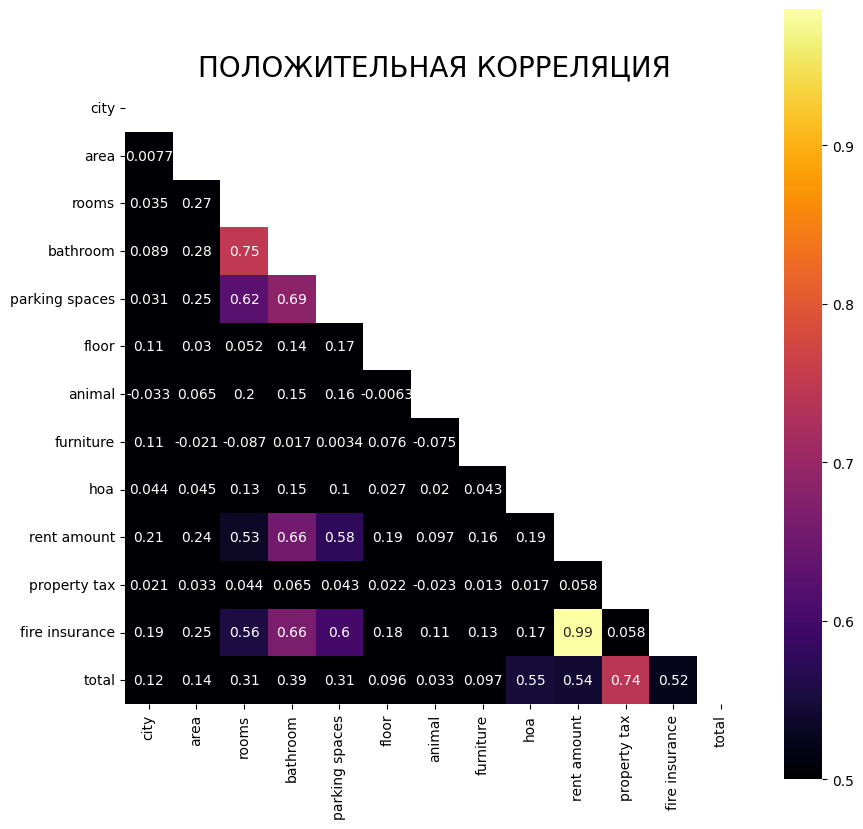

In [54]:
# ГРАФИК ПОЛОЖИТЕЛЬНОЙ КОРРЕЛЯЦИИ
fig, ax = plt.subplots(figsize=(10,10))
g = sns.heatmap(data=df_CORR, annot=True, ax=ax, square=True, vmin=0.5, cmap='inferno',
                # построение угла
                mask=np.triu(df_CORR)
                );
# заголовок
strtitle = "ПОЛОЖИТЕЛЬНАЯ КОРРЕЛЯЦИЯ"
g.set_title(label=strtitle, fontdict={'fontsize':20})

# сохранение графика
saveplot(fig=fig, strtitle=strtitle)

plt.show()

### **7.1.2. Отрицательная корреляция**

    На графике показаны параметры с отрицательной корреляцией. Это означает, что при увеличении одного параметра снижается значение другого параметра. При снижении численного значения одного параметра большая вероятность роста другого параметра, с которым он состоит в паре.

    Наименьшее возможное взаимное влияние наблюдается у пары `'furniture' vs 'rooms' (-0.08737948259465753)`.

Файл 'images/Отрицательная_Корреляция.png' сохранён


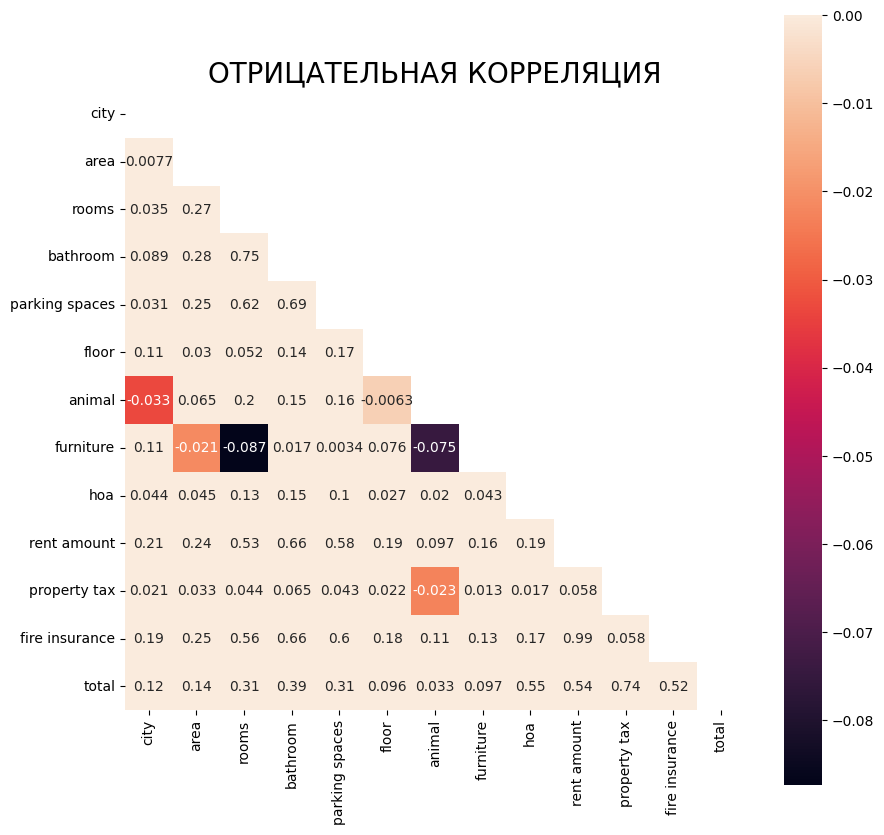

In [55]:
fig, ax = plt.subplots(figsize=(10,10))
g = sns.heatmap(data=df_CORR, annot=True, ax=ax, square=True, vmax=0,
                # построение угла
                mask=np.triu(df_CORR)
                )
# заголовок
strtitle = "ОТРИЦАТЕЛЬНАЯ КОРРЕЛЯЦИЯ"
g.set_title(label=strtitle, fontdict={'fontsize':20})

# сохранение графика
saveplot(fig=fig, strtitle=strtitle)
plt.show()

## **7.2. Тепловая карта агрегаторов**

    На графике подсвечены области для агрегаторов корреляции. Значения 'std' в диапазоне [26,33] процентов указывают на примерно одинаковое распределение данных у выбранных параметров.

Файл 'images/Тепловая_Карта_Агрегаторов.png' сохранён


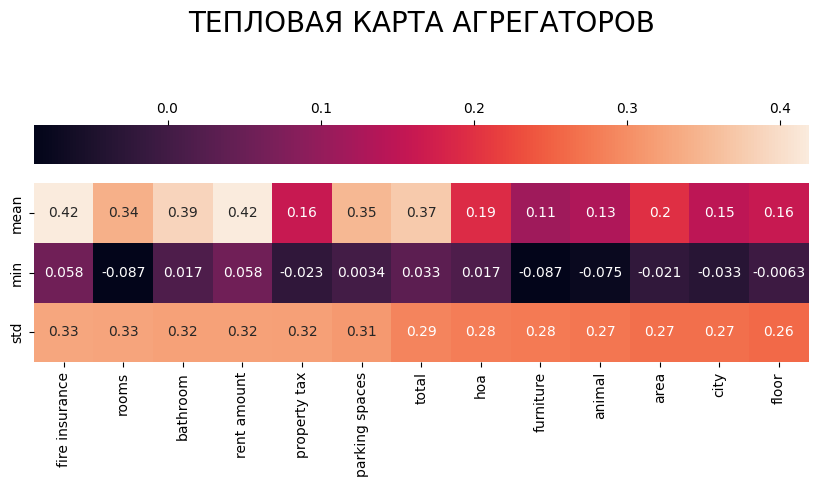

In [56]:
# ТЕПЛОВАЯ КАРТА АГРЕГАТОРОВ
fig, ax = plt.subplots(figsize=(10,5))
g = sns.heatmap(data=df_CORR_AGGREGTORS.T, annot=True, ax=ax, square=True,
                # параметры размещения тепловой шкалы
                cbar_kws={"orientation":"horizontal",
                          "location":"top"},
                )

# заголовок
strtitle = "ТЕПЛОВАЯ КАРТА АГРЕГАТОРОВ"
g.set_title(label=strtitle, fontdict={'fontsize':20}, y=1.8)

# сохранение графика
saveplot(fig=fig, strtitle=strtitle)
plt.show()

***

#### 7.3. Общая инфографика аномальных параметров (выходящих за пределы основной прослойки)

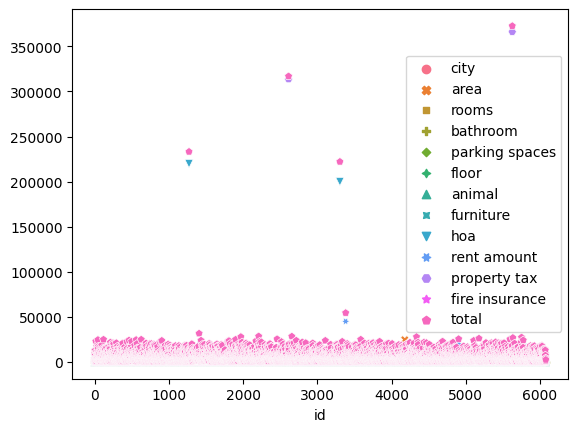

In [57]:
sns.scatterplot(df_RENT);

## **10.3. ГРАФИКИ РАСПРЕДЕЛЕНИЯ ПАРАМЕТРОВ**

    На графиках показано распределение основных данных в пределах [min,max] для каждой пары параметров.

### **10.3.1. ПАРНЫЕ ГРАФИКИ СОСТАВНЫХ ПАРАМЕТРОВ АРЕНДНОЙ ПЛАТЫ**

Наиболее ярко на графике заметны зависимости общей арендной платы '`total`' от площади объекта '`area`', коммунальных платежей '`hoa`' и налогом на имущество '`property tax`'.

Необычное не совпадающее направление с остальными показателями показывает '`furniture`'.

Файл 'images/Парные_Графики_Составляющих_Параметров_Аренды.png' сохранён


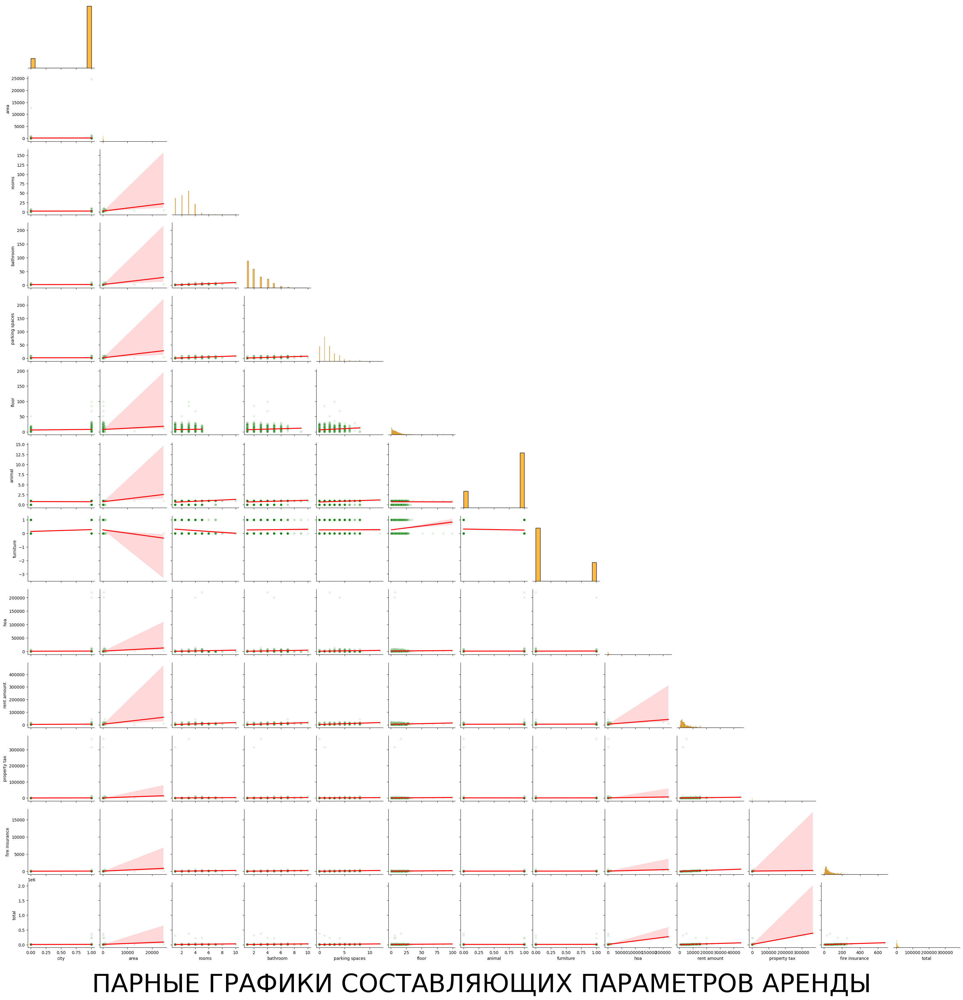

In [58]:
# ПАРНЫЕ ГРАФИКИ СОСТАВЛЯЮЩИХ ПАРАМЕТРОВ АРЕНДЫ
draw_pairplot(df_data=df_RENT, strtitle="ПАРНЫЕ ГРАФИКИ СОСТАВЛЯЮЩИХ ПАРАМЕТРОВ АРЕНДЫ", isShow=True)

### 10.3.2. ФИЛЬТР ВЫБОРКИ

In [59]:
# выборка основных параметров, ниже установленного диапазона
df_RENT_downcut = df_RENT[(df_RENT['area'] < 10000) & (df_RENT['floor'] < 25) & (df_RENT['rent amount'] < 15500) & (df_RENT['total'] < 200000)]

ПАРАМЕТРЫ БЕЗ ФИЛЬТРОВ

Нужны только для проверки отображения данных. Закомментированы специально.

In [60]:
# параметры без фильров
# draw_jointplot(df_data=df_RENT, column_list=column_list, subfolder="vs")

ПАРАМЕТРЫ С ФИЛЬТРАМИ

In [61]:
# параметры с фильрами
draw_jointplot(df_data=df_RENT_downcut, column_list=column_list, subfolder="vs_cut")

Файл 'images\vs_cut/Total_Vs_City.png' сохранён
Файл 'images\vs_cut/Total_Vs_Area.png' сохранён
Файл 'images\vs_cut/Total_Vs_Rooms.png' сохранён
Файл 'images\vs_cut/Total_Vs_Bathroom.png' сохранён
Файл 'images\vs_cut/Total_Vs_Parking_Spaces.png' сохранён
Файл 'images\vs_cut/Total_Vs_Floor.png' сохранён
Файл 'images\vs_cut/Total_Vs_Animal.png' сохранён
Файл 'images\vs_cut/Total_Vs_Furniture.png' сохранён
Файл 'images\vs_cut/Total_Vs_Hoa.png' сохранён
Файл 'images\vs_cut/Total_Vs_Rent_Amount.png' сохранён
Файл 'images\vs_cut/Total_Vs_Property_Tax.png' сохранён
Файл 'images\vs_cut/Total_Vs_Fire_Insurance.png' сохранён
Файл 'images\vs_cut/Total_Vs_Total.png' сохранён


Файл 'images/Распредение.png' сохранён


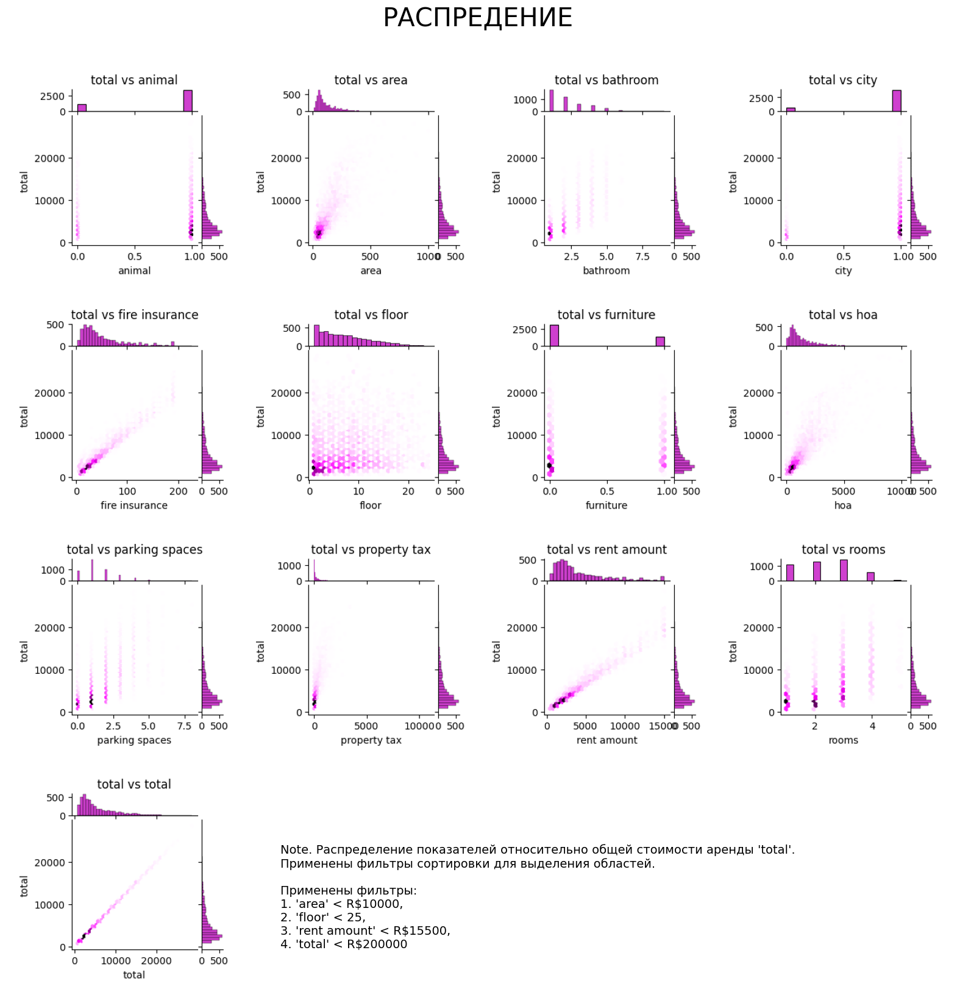

In [62]:
draw_grid_jointplot(strtitle="РАСПРЕДЕНИЕ", column_list=column_list, x_title=2, y_title=-0.8, wspace=0, hspace=0,
              # примечание
              strnote="Note. Распределение показателей относительно общей стоимости аренды 'total'.\nПрименены фильтры сортировки для выделения областей.\n\n" +
                      "Применены фильтры:\n1. 'area' < R$10000,\n2. 'floor' < 25,\n3. 'rent amount' < R$15500,\n4. 'total' < R$200000",
                      x_note=0.35, y_note=0.15                  
                    )

### **10.4. Количественные графики параметров**

Анализ общего количества составляющих арендной платы `'total'` выделяет группу `нефинансовых параметров`, для которой построен отдельный график.

`Финансовые параметры` можно изучить на других графиках.

    Задокументированная функция создаст график и покажет все параметры, некоторые из них перегружены информацией. Поэтому отображение этих параметров было разделено. И для них были выбраны разные типы графиков.

In [63]:
# # КОЛИЧЕСТВЕННЫЕ ГРАФИКИ ПАРАМЕТРОВ
# plot_box_grid(data=df_RENT, figsize=(30,30), kind="count",
#              strtitle="КОЛИЧЕСТВЕННЫЕ ГРАФИКИ ПАРАМЕТРОВ", fontsize=50, x_title=None, y_title=0.92,
#              # расстояние между внутренними графиками
#              wspace=0.3, hspace=None)


#### 10.4.1. Графики НЕФИНАНСОВЫХ параметров

Выделяются на фоне остальных параметров в своей группе `квартиры с 3мя комнатами`, квартиры с `1й ванной комнатой`, квартиры на `1м этаже`, квартиры с `1м парковочным местом`. С увеличением количества комнат, ванных комнат, этажности и парковочных мест количество сдаваемых квартир меньше.

Количество аренды выше у квартир где `разрешены животные` и без `оснащения мебелью`. В `Городе '1' квартир больше`.



Файл 'images/Количественные_Графики_Нефинансовых_Параметров.png' сохранён


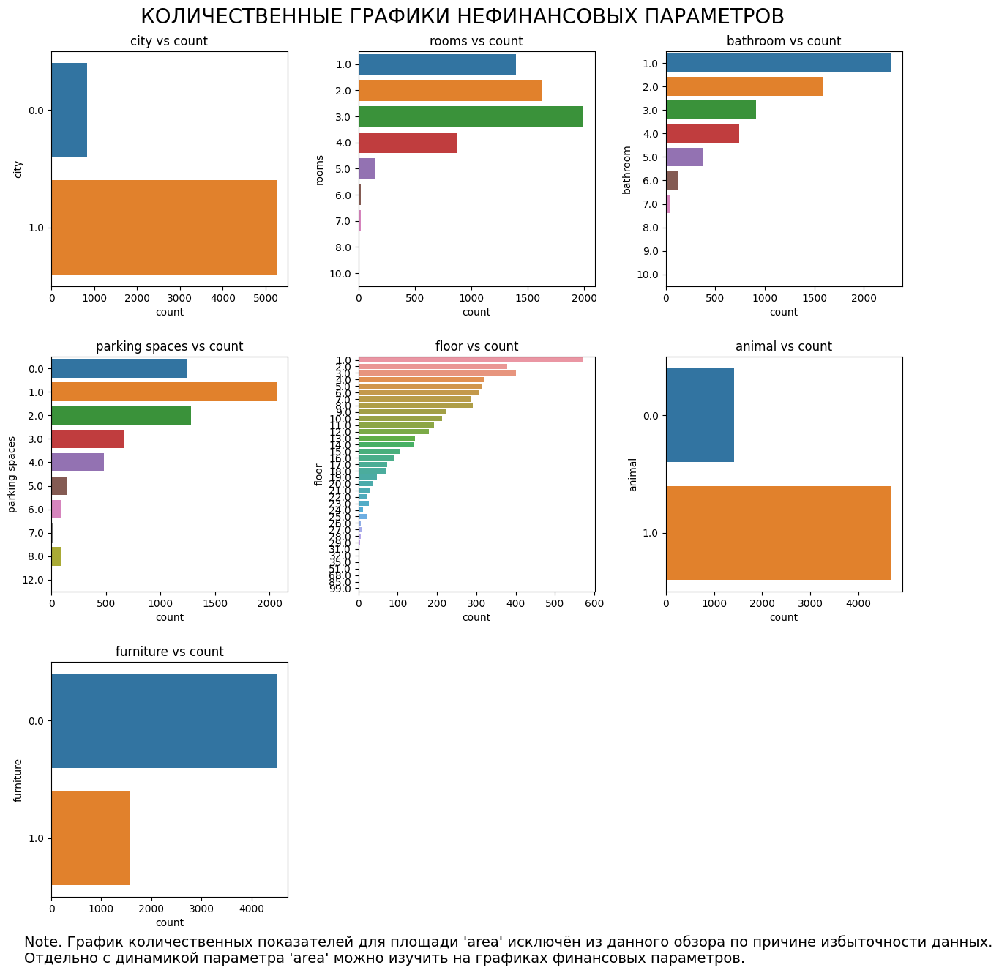

In [64]:
# Графики НЕФИНАНСОВЫХ параметров
# выделены НЕфинансовые параметры без площади
plot_box_grid(data=df_RENT[non_cash_list[0:1] + non_cash_list[2:]], figsize=(15,15), kind="count", hspace=0.3,
              # параметры заголовка
              strtitle="КОЛИЧЕСТВЕННЫЕ ГРАФИКИ НЕФИНАНСОВЫХ ПАРАМЕТРОВ",
              # координаты заголовка
              fontsize=20, x_title=None, y_title=0.92,
              # примечание
              strnote="Note. График количественных показателей для площади 'area' исключён из данного обзора по причине избыточности данных.\nОтдельно с динамикой параметра 'area' можно изучить на графиках финансовых параметров.",
              x_note=0.1, y_note=0.05
              )


#### 10.4.2. ГРАФИКИ РАСПРЕДЕЛЕНИЯ ПАРАМЕТРОВ

Отмечается аномальное проявление количественных показателей каждого параметра (кроме бинарных параметров, например, город), о чём говорит большой хвост из данных в сторону увеличения.

Файл 'images/Графики_Распределения_Параметров.png' сохранён


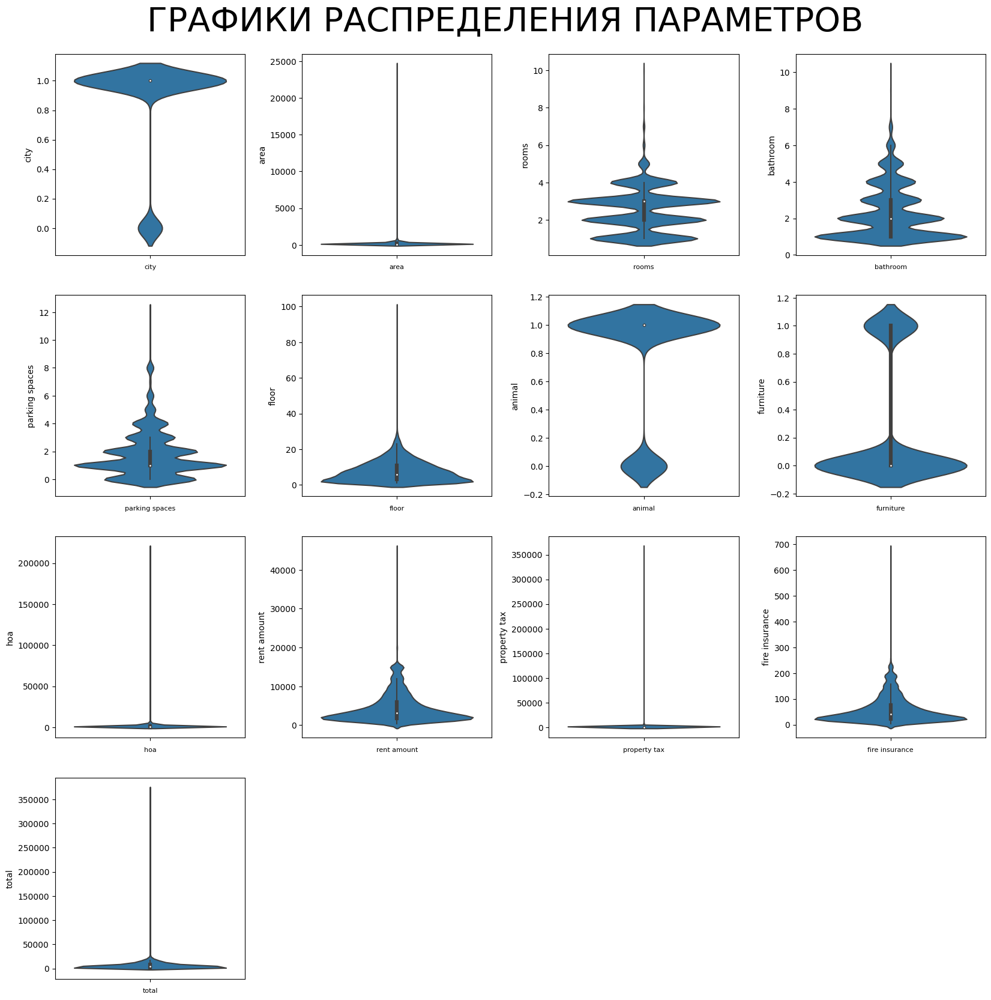

In [65]:
# ГРАФИКИ РАСПРЕДЕЛЕНИЯ ПАРАМЕТРОВ
plot_box_grid(data=df_RENT, strtitle="ГРАФИКИ РАСПРЕДЕЛЕНИЯ ПАРАМЕТРОВ", kind="violin", fontsize=40, x_title=None, y_title=0.92)


### **10.5. ВЛИЯНИЕ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ**

На этих графиках показаны более наглядно те проявления и влияния параметров, которые наблюдаются на количественных и распределительных графиках.

Построения сделаны для всех городов и для каждого в отдельности. Так же были применены фильтры сортировки для выделения фрагментов с наибольшим скоплением данных (отсев аномалий). Фильтрация была сделана после анализа графика общей выборки. Параметры фильтрации указаны на графиках.

Рекомендуется анализировать все типы графиков параллельно, так как каждый из типов графиков отображает некоторые детали, которые нет возможности отобразить на каком-то одном из графиков без искажения. Что в свою очередь приводит к лишней избыточности.

Так же на графиках подтверждаются выводы, сделанные при получении информационной таблицы и определения корреляционной зависимости.

#### 10.5.1. ОБЩАЯ ВЫБОРКА ВЛИЯНИЯ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ

Файл 'images/Общая_Инфографика_Влияния_Параметров_На_Арендную_Плату.png' сохранён


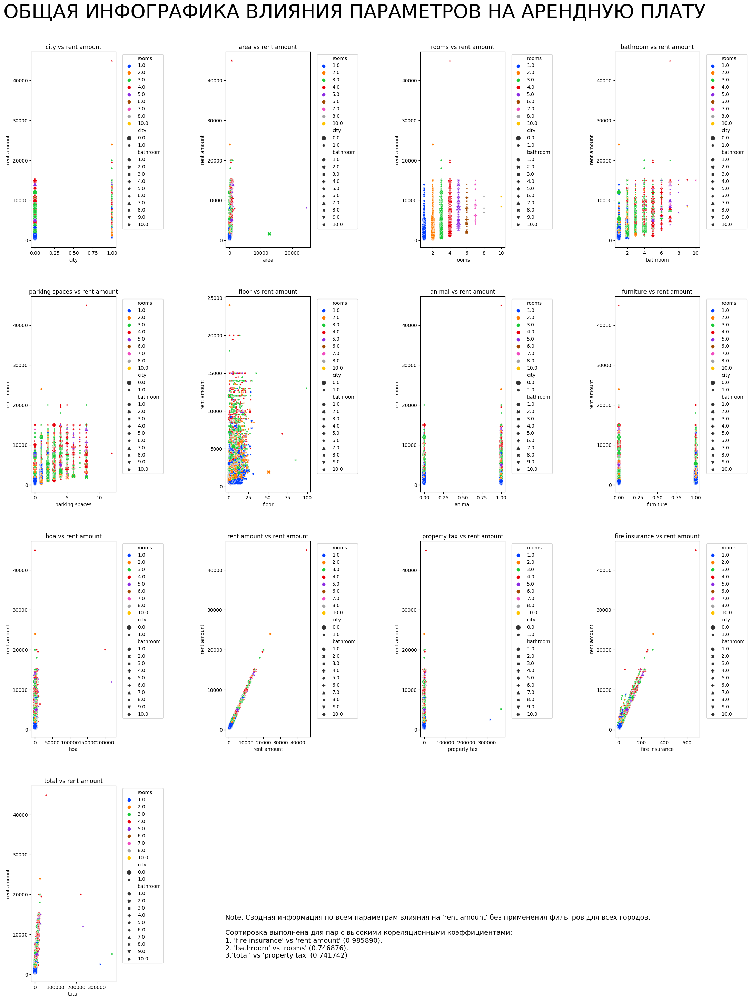

In [66]:
# ОБЩАЯ ВЫБОРКА ВЛИЯНИЯ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ
plot_box_grid(data=df_RENT,figsize=(25,35),
              # параметры графика и легенды
              kind="scatterplot", legend_col=1, legend_fontsize=10,
              # заголовок
              strtitle="ОБЩАЯ ИНФОГРАФИКА ВЛИЯНИЯ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ", fontsize=40, x_title=None, y_title=0.92, wspace=1.3, hspace=0.25,
              # примечание
              strnote="Note. Сводная информация по всем параметрам влияния на 'rent amount' без применения фильтров для всех городов.\n\n" +
                      "Сортировка выполнена для пар с высокими кореляционными коэффициентами:\n" + 
                      "1. 'fire insurance' vs 'rent amount' (0.985890),\n" +"2. 'bathroom' vs 'rooms' (0.746876),\n" + "3.'total' vs 'property tax' (0.741742)",
                      x_note=0.35, y_note=0.13
              )

##### 10.5.1.1. Город '0' - ОБЩАЯ ИНФОГРАФИКА ВЛИЯНИЯ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ

Файл 'images/Город_'0'_-_Общая_Инфографика_Влияния_Параметров_На_Арендную_Плату.png' сохранён


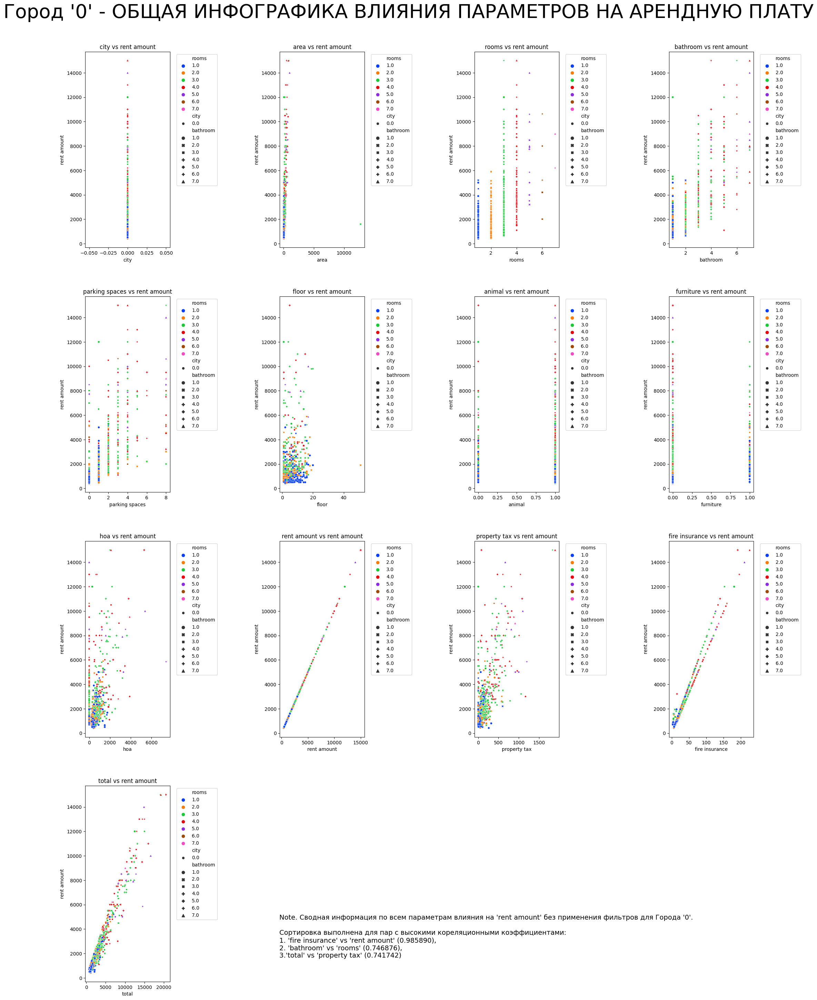

In [67]:
# Город '0' - ОБЩАЯ ИНФОГРАФИКА ВЛИЯНИЯ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ
plot_box_grid(data=df_RENT.query('city == 0'),figsize=(25,35),
              # параметры графика и легенды
              kind="scatterplot", legend_col=1, legend_fontsize=10,
              # заголовок
              strtitle="Город '0' - ОБЩАЯ ИНФОГРАФИКА ВЛИЯНИЯ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ", fontsize=40, x_title=None, y_title=0.92, wspace=1.3, hspace=0.25,
              # примечание
              strnote="Note. Сводная информация по всем параметрам влияния на 'rent amount' без применения фильтров для Города '0'.\n\n" +
                      "Сортировка выполнена для пар с высокими кореляционными коэффициентами:\n" + 
                      "1. 'fire insurance' vs 'rent amount' (0.985890),\n" +"2. 'bathroom' vs 'rooms' (0.746876),\n" + "3.'total' vs 'property tax' (0.741742)",
                      x_note=0.35, y_note=0.13
              )

##### 10.5.1.2. Город '1' - ОБЩАЯ ИНФОГРАФИКА ВЛИЯНИЯ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ

Файл 'images/Город_'1'_-_Общая_Инфографика_Влияния_Параметров_На_Арендную_Плату.png' сохранён


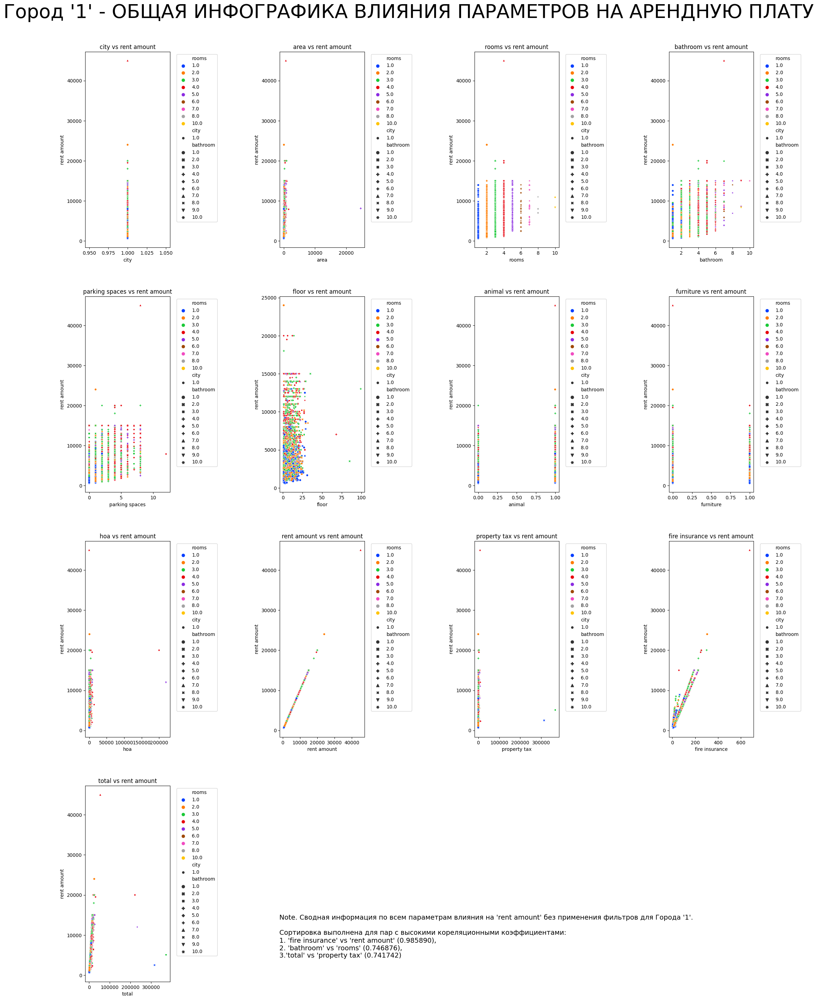

In [68]:
# Город '1' - ОБЩАЯ ИНФОГРАФИКА ВЛИЯНИЯ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ
plot_box_grid(data=df_RENT.query('city == 1'),figsize=(25,35),
              # параметры графика и легенды
              kind="scatterplot", legend_col=1, legend_fontsize=10,
              # заголовок
              strtitle="Город '1' - ОБЩАЯ ИНФОГРАФИКА ВЛИЯНИЯ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ", fontsize=40, x_title=None, y_title=0.92, wspace=1.3, hspace=0.25,
              # примечание
              strnote="Note. Сводная информация по всем параметрам влияния на 'rent amount' без применения фильтров для Города '1'.\n\n" +
                      "Сортировка выполнена для пар с высокими кореляционными коэффициентами:\n" + 
                      "1. 'fire insurance' vs 'rent amount' (0.985890),\n" +"2. 'bathroom' vs 'rooms' (0.746876),\n" + "3.'total' vs 'property tax' (0.741742)",
                      x_note=0.35, y_note=0.13
              )

#### 10.5.2. НИЖНЯЯ ВЫБОРКА ВЛИЯНИЯ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ

Файл 'images/Нижняя_Выборка_Влияния_Параметров_На_Арендную_Плату.png' сохранён


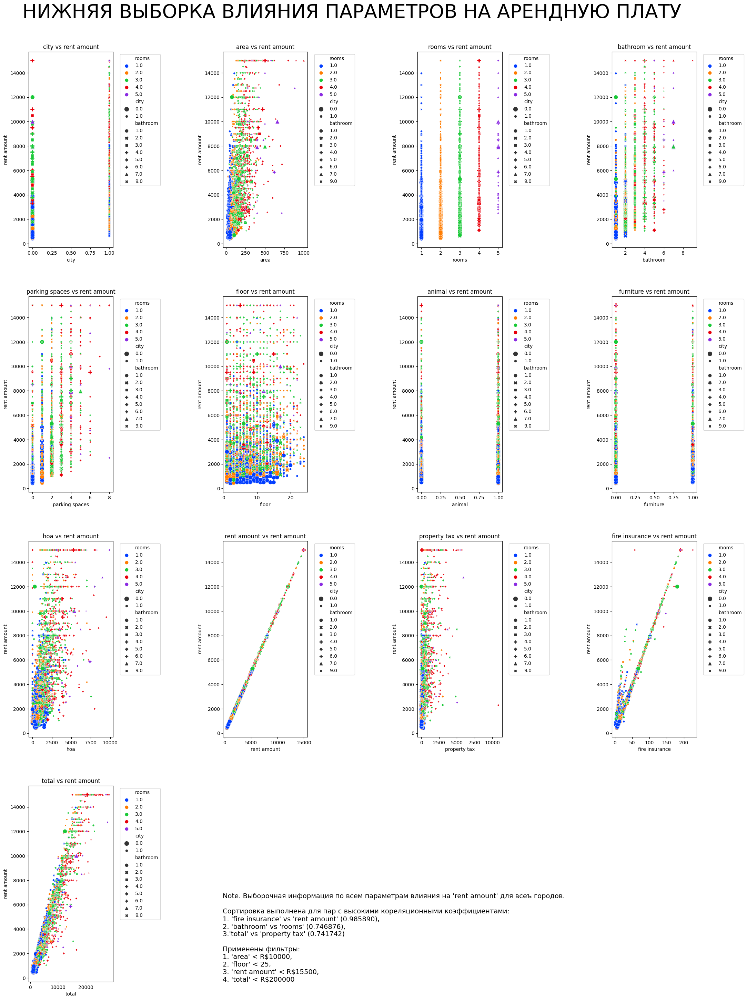

In [69]:
# НИЖНЯЯ ВЫБОРКА ВЛИЯНИЯ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ
plot_box_grid(data=df_RENT_downcut,
              # параметры графика и легенды
              kind="scatterplot", legend_col=1, legend_fontsize=10,
              # заголовок
              strtitle="НИЖНЯЯ ВЫБОРКА ВЛИЯНИЯ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ",figsize=(25,35),
              fontsize=40, x_title=None, y_title=0.92, wspace=1.3, hspace=0.25,
              # примечание
              strnote="Note. Выборочная информация по всем параметрам влияния на 'rent amount' для всеъ городов.\n\n" +
                      "Сортировка выполнена для пар с высокими кореляционными коэффициентами:\n" + 
                      "1. 'fire insurance' vs 'rent amount' (0.985890),\n" +"2. 'bathroom' vs 'rooms' (0.746876),\n" + "3.'total' vs 'property tax' (0.741742)\n\n" +
                      "Применены фильтры:\n1. 'area' < R$10000,\n2. 'floor' < 25,\n3. 'rent amount' < R$15500,\n4. 'total' < R$200000",
                      x_note=0.35, y_note=0.11
              )

##### 10.5.2.1. Город '0' - НИЖНЯЯ ВЫБОРКА ВЛИЯНИЯ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ

Файл 'images/Город_'0'.Нижняя_Выборка_Влияния_Параметров_На_Арендную_Плату.png' сохранён


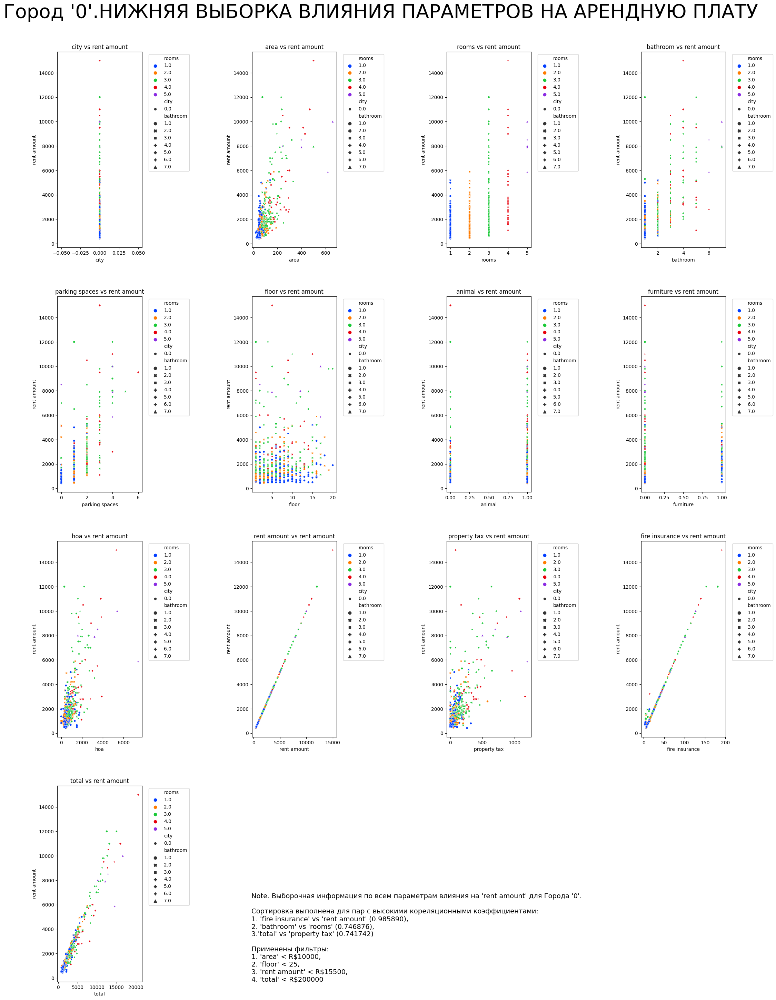

In [70]:
# Город '0' - НИЖНЯЯ ВЫБОРКА ВЛИЯНИЯ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ
plot_box_grid(data=df_RENT_downcut.query('city == 0'),
              # параметры графика и легенды
              kind="scatterplot", legend_col=1, legend_fontsize=10,
              # заголовок
              strtitle="Город '0'.НИЖНЯЯ ВЫБОРКА ВЛИЯНИЯ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ",figsize=(25,35),
              fontsize=40, x_title=None, y_title=0.92, wspace=1.3, hspace=0.25,
              # примечание
              strnote="Note. Выборочная информация по всем параметрам влияния на 'rent amount' для Города '0'.\n\n" +
                      "Сортировка выполнена для пар с высокими кореляционными коэффициентами:\n" + 
                      "1. 'fire insurance' vs 'rent amount' (0.985890),\n" +"2. 'bathroom' vs 'rooms' (0.746876),\n" + "3.'total' vs 'property tax' (0.741742)\n\n" +
                      "Применены фильтры:\n1. 'area' < R$10000,\n2. 'floor' < 25,\n3. 'rent amount' < R$15500,\n4. 'total' < R$200000",
                      x_note=0.35, y_note=0.11
              )

##### 10.5.2.2. Город '1' - НИЖНЯЯ ВЫБОРКА ВЛИЯНИЯ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ

Файл 'images/Город_'1'.Нижняя_Выборка_Влияния_Параметров_На_Арендную_Плату.png' сохранён


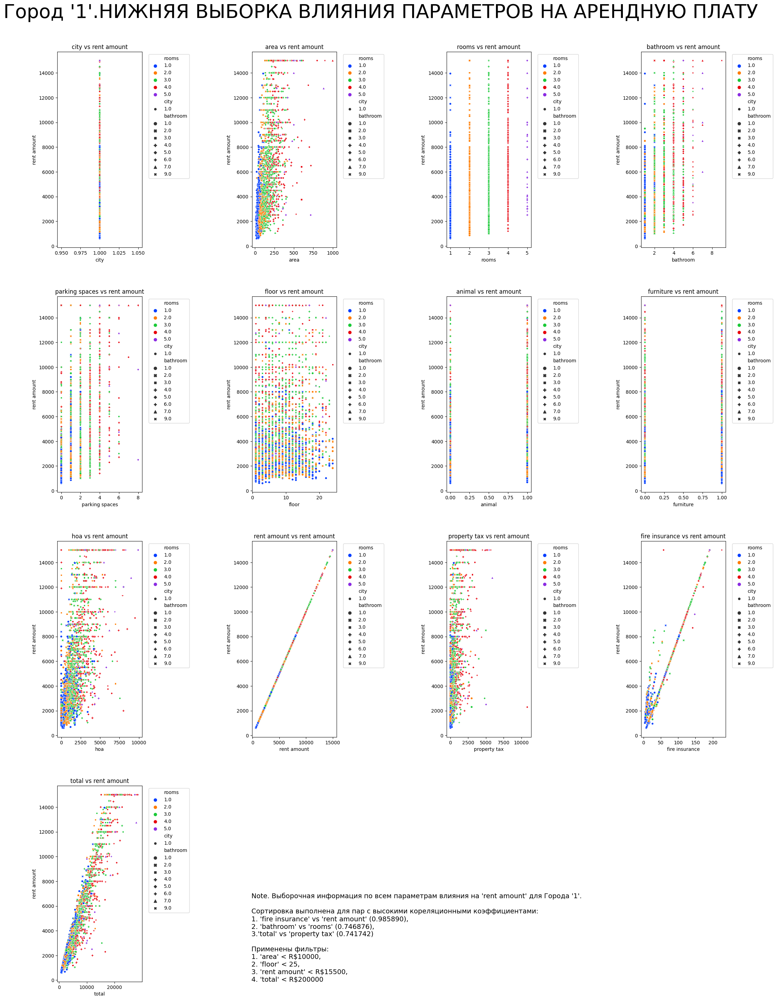

In [71]:
# Город '1' - НИЖНЯЯ ВЫБОРКА ВЛИЯНИЯ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ
plot_box_grid(data=df_RENT_downcut.query('city == 1'),
              # параметры графика и легенды
              kind="scatterplot", legend_col=1, legend_fontsize=10,
              # заголовок
              strtitle="Город '1'.НИЖНЯЯ ВЫБОРКА ВЛИЯНИЯ ПАРАМЕТРОВ НА АРЕНДНУЮ ПЛАТУ",figsize=(25,35),
              fontsize=40, x_title=None, y_title=0.92, wspace=1.3, hspace=0.25,
              # примечание
              strnote="Note. Выборочная информация по всем параметрам влияния на 'rent amount' для Города '1'.\n\n" +
                      "Сортировка выполнена для пар с высокими кореляционными коэффициентами:\n" + 
                      "1. 'fire insurance' vs 'rent amount' (0.985890),\n" +"2. 'bathroom' vs 'rooms' (0.746876),\n" + "3.'total' vs 'property tax' (0.741742)\n\n" +
                      "Применены фильтры:\n1. 'area' < R$10000,\n2. 'floor' < 25,\n3. 'rent amount' < R$15500,\n4. 'total' < R$200000",
                      x_note=0.35, y_note=0.11
              )

#### 10.5.3. КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ

Файл 'images/Количественная_Динамика_Параметров.png' сохранён


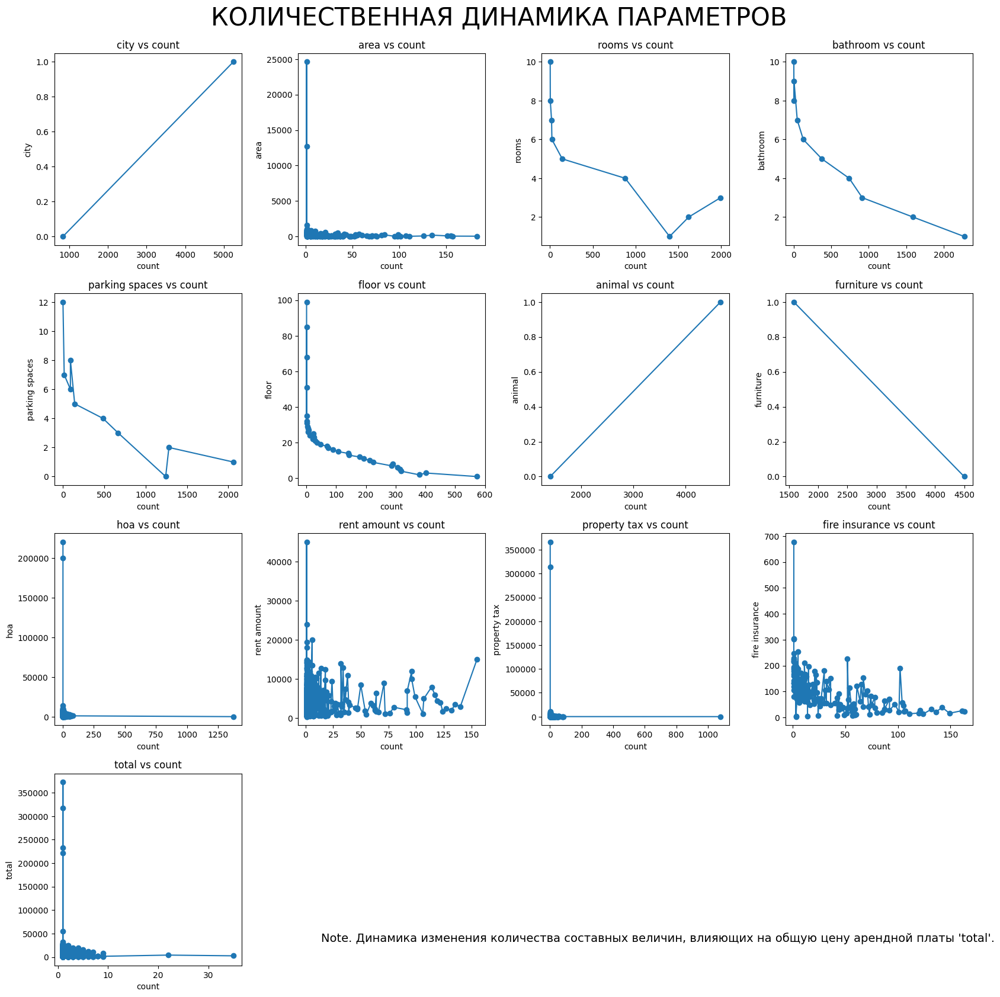

In [72]:
# КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ
plot_box_grid(data=df_RENT,figsize=(20,20),
              # параметры графика и легенды
              kind="plot", legend_col=1, legend_fontsize=10,
              # заголовок
              strtitle="КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ", fontsize=30, x_title=None, y_title=0.92, wspace=0.3, hspace=0.25,
              # примечание
              strnote="Note. Динамика изменения количества составных величин, влияющих на общую цену арендной платы 'total'.", x_note=0.35, y_note=0.13
              )

#### 10.5.3.1. Город '0' - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ

Файл 'images/Город_'0'.Количественная_Динамика_Параметров.png' сохранён


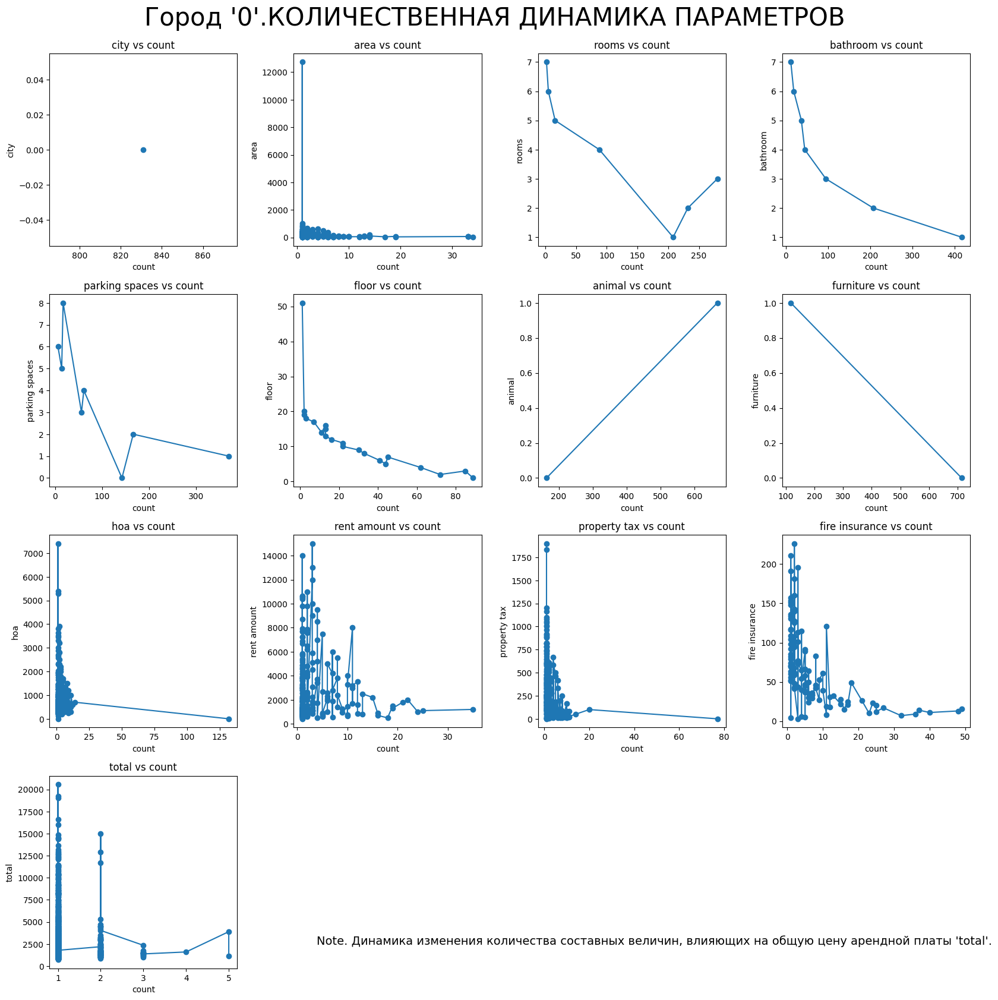

In [73]:
# Город '0' - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ
plot_box_grid(data=df_RENT.query('city == 0'),figsize=(20,20),
              # параметры графика и легенды
              kind="plot", legend_col=1, legend_fontsize=10,
              # заголовок
              strtitle="Город '0'.КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ", fontsize=30, x_title=None, y_title=0.92, wspace=0.3, hspace=0.25,
              # примечание
              strnote="Note. Динамика изменения количества составных величин, влияющих на общую цену арендной платы 'total'.", x_note=0.35, y_note=0.13
              )

#### 10.5.3.2. Город '1' - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ

Файл 'images/Город_'1'.Количественная_Динамика_Параметров.png' сохранён


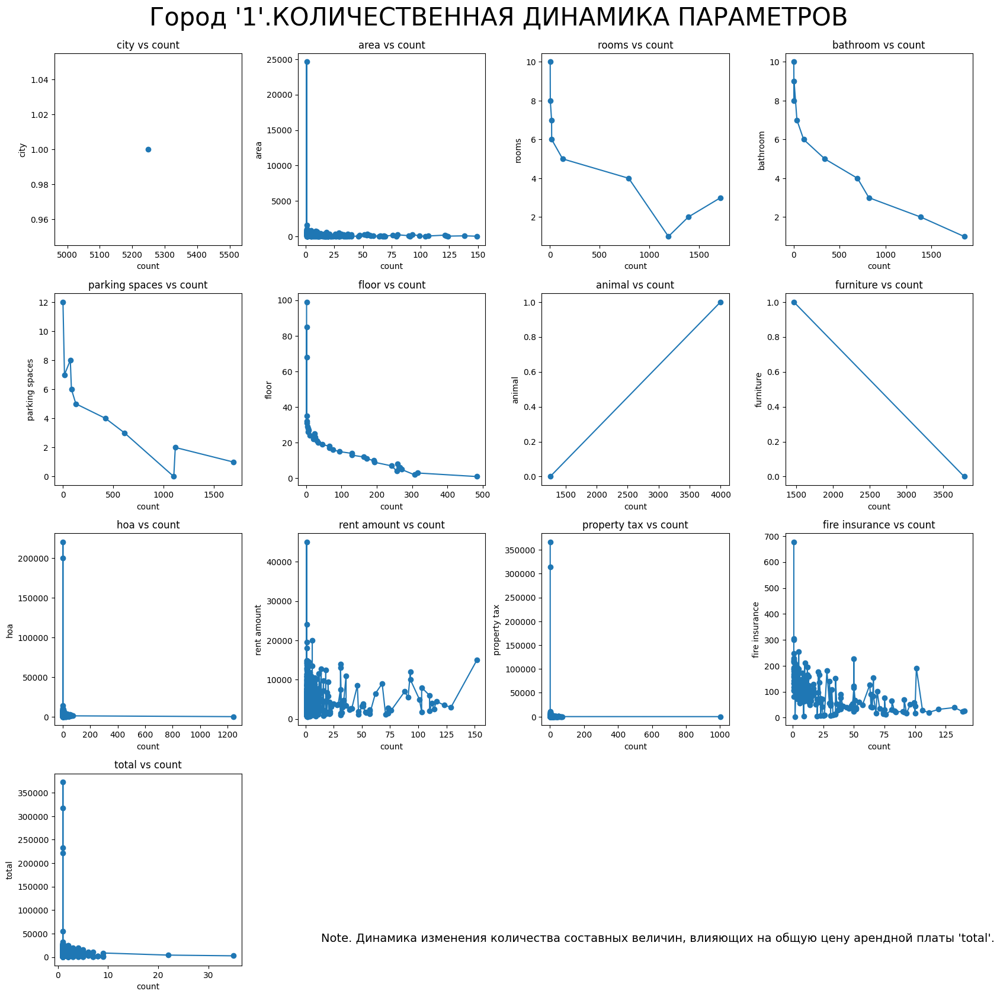

In [74]:
# Город '1' - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ
plot_box_grid(data=df_RENT.query('city == 1'),figsize=(20,20),
              # параметры графика и легенды
              kind="plot", legend_col=1, legend_fontsize=10,
              # заголовок
              strtitle="Город '1'.КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ", fontsize=30, x_title=None, y_title=0.92, wspace=0.3, hspace=0.25,
              # примечание
              strnote="Note. Динамика изменения количества составных величин, влияющих на общую цену арендной платы 'total'.", x_note=0.35, y_note=0.13
              )

### 10.5.3. KDE - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ

Файл 'images/Kde_-_Количественная_Динамика_Параметров.png' сохранён


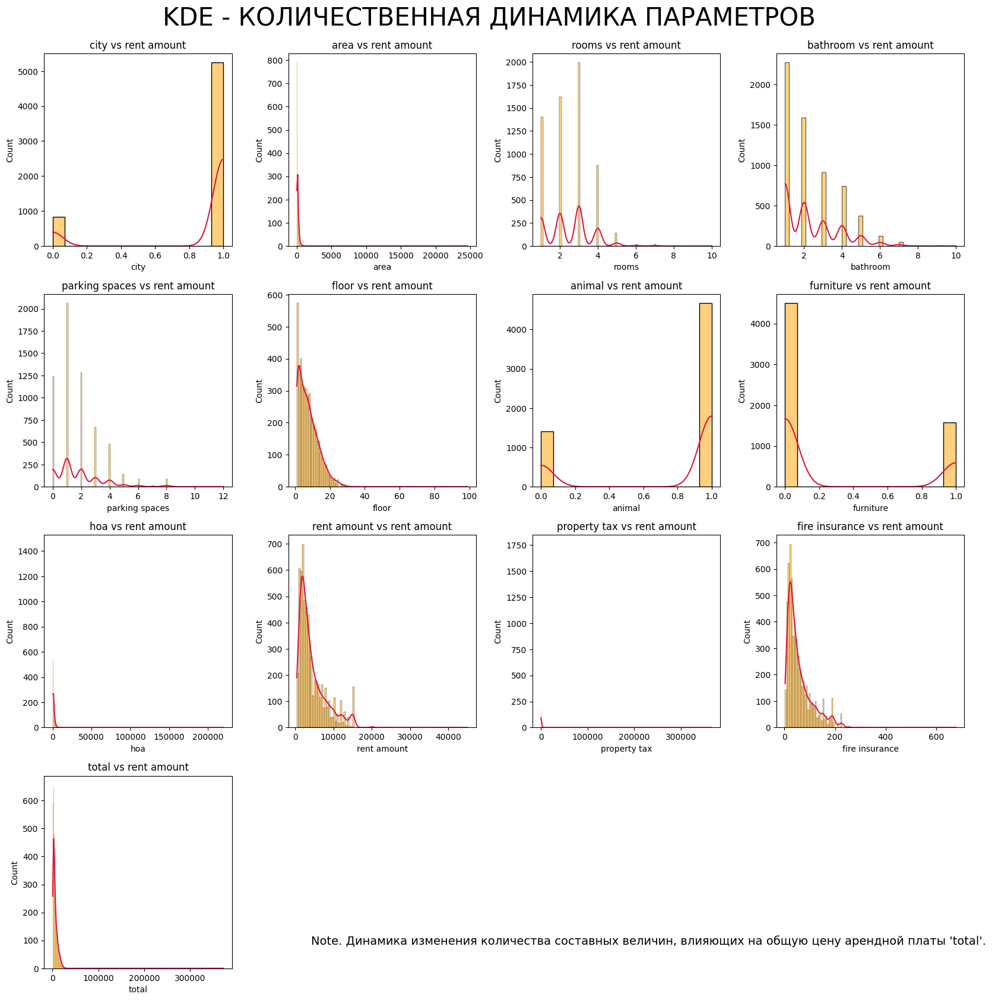

In [75]:
# KDE - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ
plot_box_grid(data=df_RENT,figsize=(20,20),
              # параметры графика и легенды
              kind="kde", legend_col=1, legend_fontsize=10,
              # заголовок
              strtitle="KDE - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ", fontsize=30, x_title=None, y_title=0.92, wspace=0.3, hspace=0.25,
              # примечание
              strnote="Note. Динамика изменения количества составных величин, влияющих на общую цену арендной платы 'total'.", x_note=0.35, y_note=0.13
              )

#### 10.5.3.1. KDE - Город '0' - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ

Файл 'images/Kde_-_Город_'0'_-_Количественная_Динамика_Параметров.png' сохранён


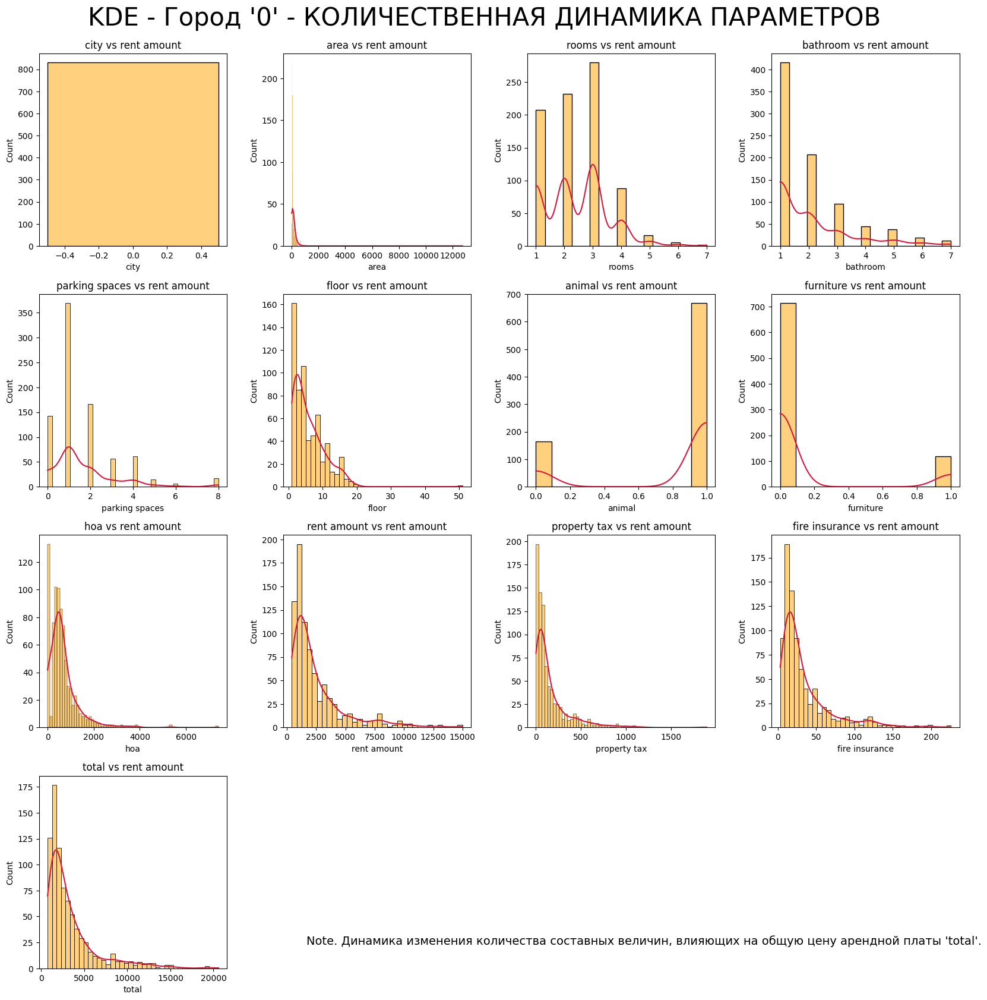

In [76]:
# KDE - Город '0' - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ
plot_box_grid(data=df_RENT.query('city == 0'),figsize=(20,20),
              # параметры графика и легенды
              kind="kde", legend_col=1, legend_fontsize=10,
              # заголовок
              strtitle="KDE - Город '0' - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ", fontsize=30, x_title=None, y_title=0.92, wspace=0.3, hspace=0.25,
              # примечание
              strnote="Note. Динамика изменения количества составных величин, влияющих на общую цену арендной платы 'total'.", x_note=0.35, y_note=0.13
              )

10.5.3.2. KDE - Город '1' - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ

Файл 'images/Kde_-_Город_'1'_-_Количественная_Динамика_Параметров.png' сохранён


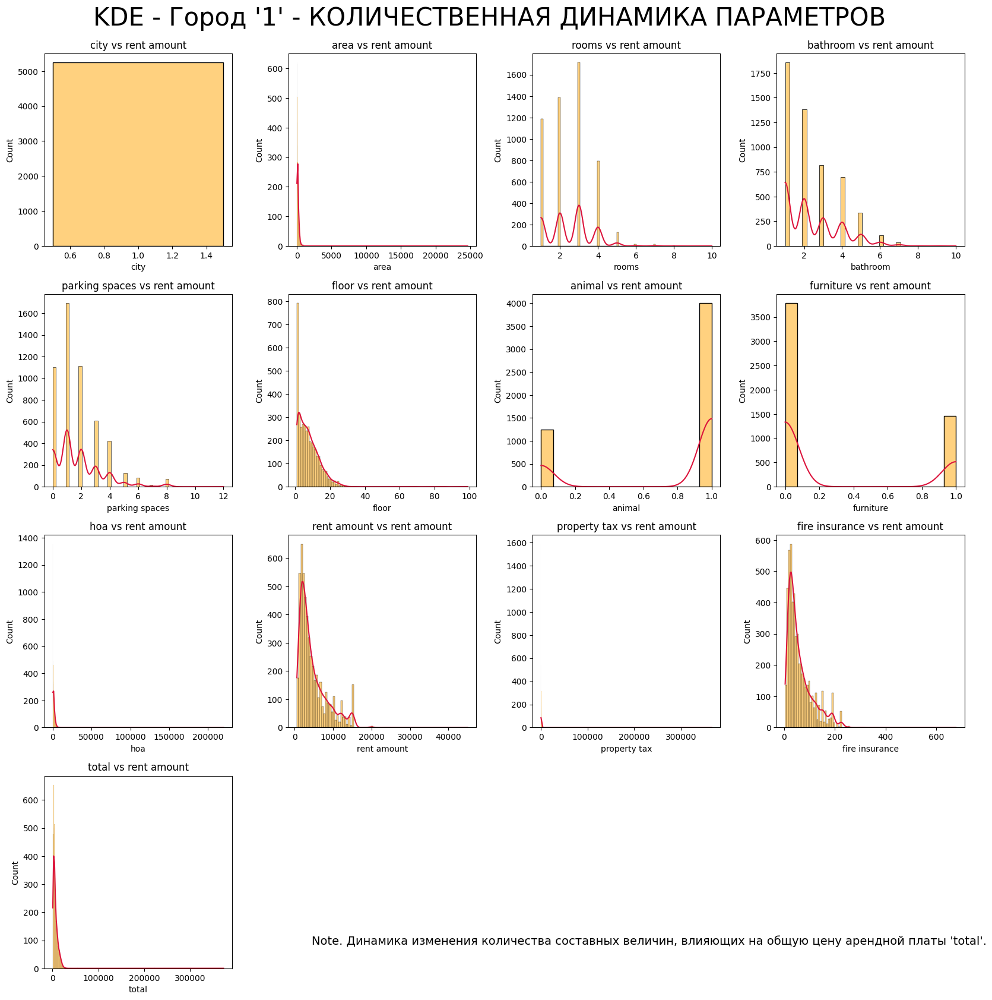

In [77]:
# KDE - Город '1' - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ
plot_box_grid(data=df_RENT.query('city == 1'),figsize=(20,20),
              # параметры графика и легенды
              kind="kde", legend_col=1, legend_fontsize=10,
              # заголовок
              strtitle="KDE - Город '1' - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ", fontsize=30, x_title=None, y_title=0.92, wspace=0.3, hspace=0.25,
              # примечание
              strnote="Note. Динамика изменения количества составных величин, влияющих на общую цену арендной платы 'total'.", x_note=0.35, y_note=0.13
              )

#### 10.5.2.2. KDE - short - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ

Файл 'images/Kde_-_Short_-_Количественная_Динамика_Параметров.png' сохранён


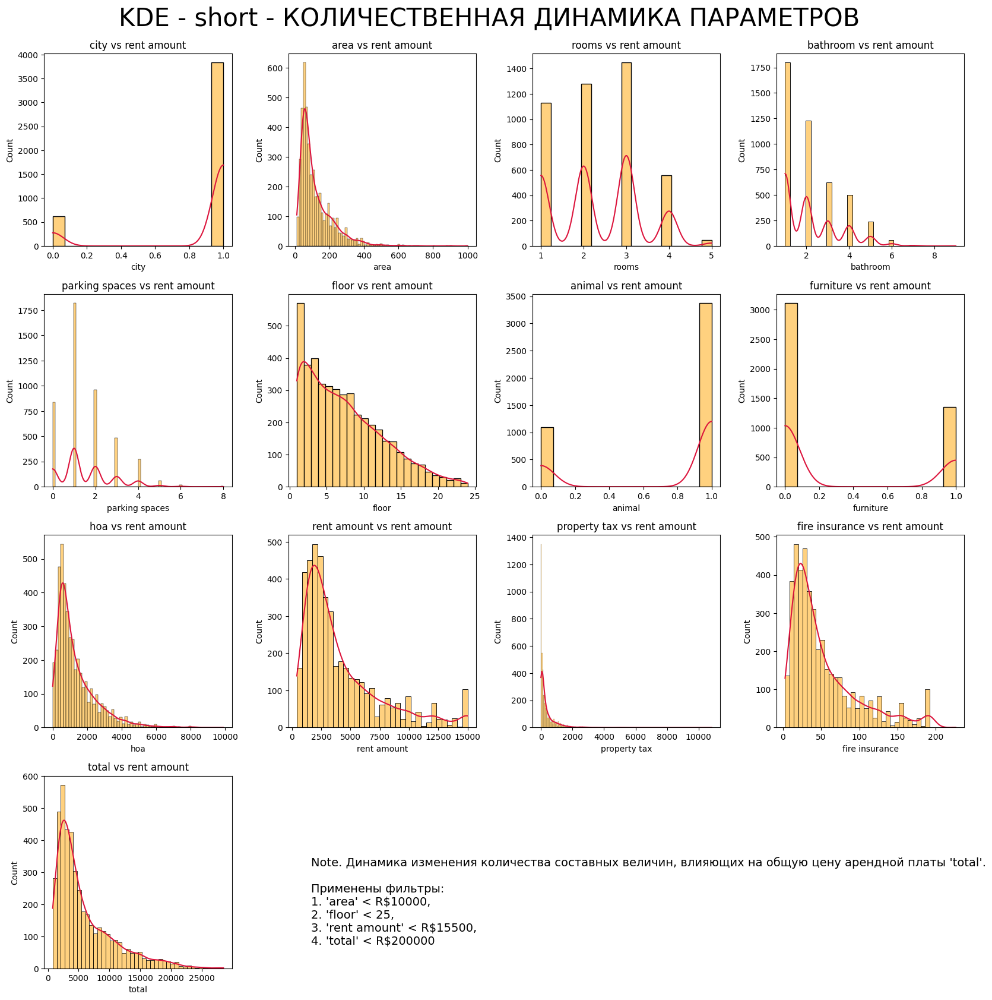

In [78]:
# KDE - short - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ
plot_box_grid(data=df_RENT_downcut, figsize=(20,20),
              # параметры графика и легенды
              kind="kde", legend_col=1, legend_fontsize=10,
              # заголовок
              strtitle="KDE - short - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ", fontsize=30, x_title=None, y_title=0.92, wspace=0.3, hspace=0.25,
              # примечание
              strnote="Note. Динамика изменения количества составных величин, влияющих на общую цену арендной платы 'total'.\n\n" +
                      "Применены фильтры:\n1. 'area' < R$10000,\n2. 'floor' < 25,\n3. 'rent amount' < R$15500,\n4. 'total' < R$200000",
              x_note=0.35, y_note=0.13
              )

#### 10.5.2.3. KDE -short- Город '0' - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ

Файл 'images/Kde-Short-_Город_'0'_-_Количественная_Динамика_Параметров.png' сохранён


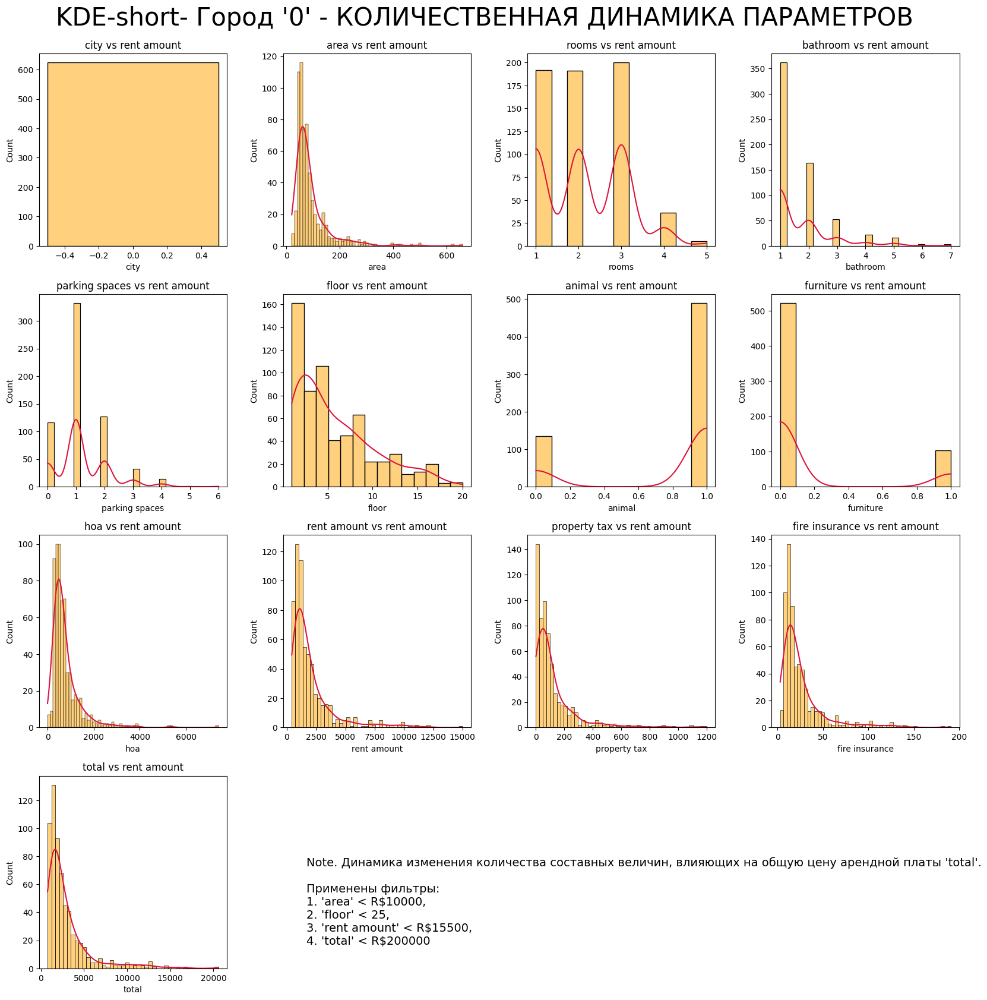

In [79]:
# KDE -short- Город '0' - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ
plot_box_grid(data=df_RENT_downcut.query('city == 0'),figsize=(20,20),
              # параметры графика и легенды
              kind="kde", legend_col=1, legend_fontsize=10,
              # заголовок
              strtitle="KDE-short- Город '0' - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ", fontsize=30, x_title=None, y_title=0.92, wspace=0.3, hspace=0.25,
              # примечание
              strnote="Note. Динамика изменения количества составных величин, влияющих на общую цену арендной платы 'total'.\n\n" +
                      "Применены фильтры:\n1. 'area' < R$10000,\n2. 'floor' < 25,\n3. 'rent amount' < R$15500,\n4. 'total' < R$200000",
              x_note=0.35, y_note=0.13
              )

#### 10.5.2.4. KDE-short- Город '1' - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ

Файл 'images/Kde-Short-_Город_'1'_-_Количественная_Динамика_Параметров.png' сохранён


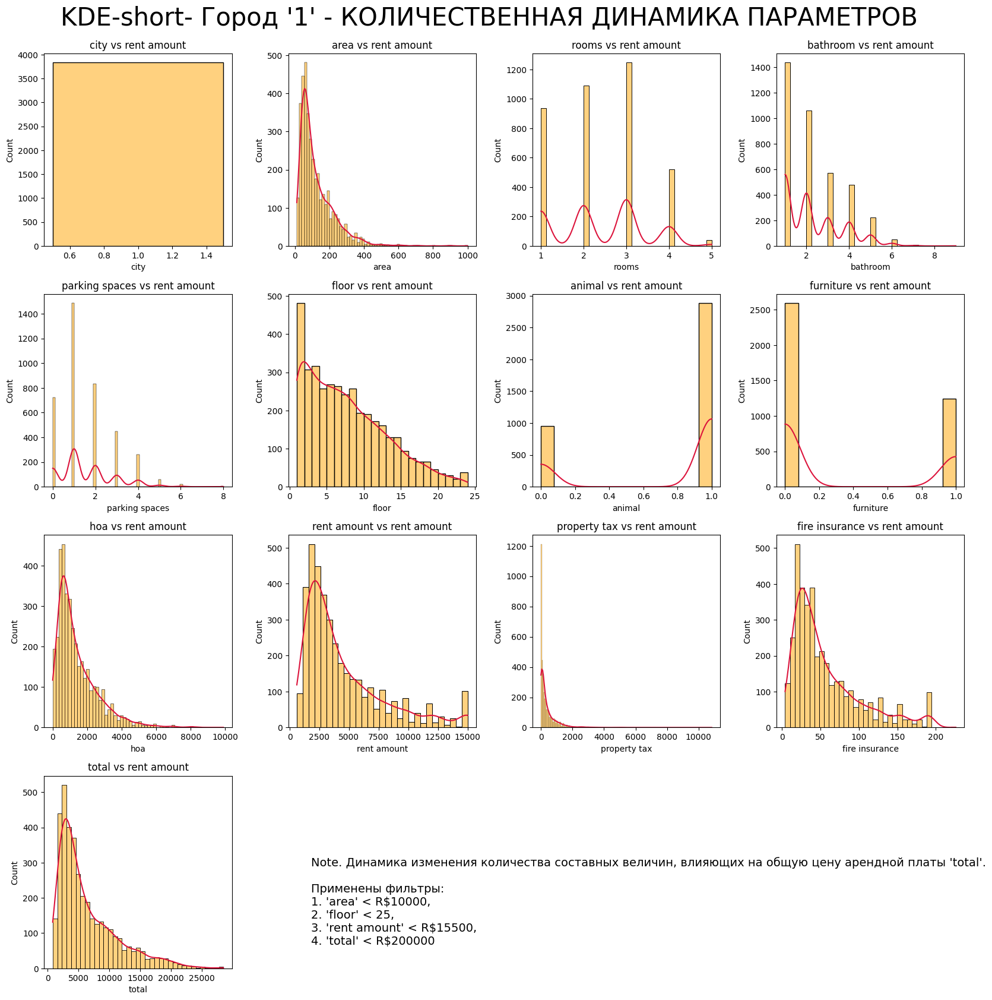

In [80]:
# KDE-short- Город '1' - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ
plot_box_grid(data=df_RENT_downcut.query('city == 1'),figsize=(20,20),
              # параметры графика и легенды
              kind="kde", legend_col=1, legend_fontsize=10,
              # заголовок
              strtitle="KDE-short- Город '1' - КОЛИЧЕСТВЕННАЯ ДИНАМИКА ПАРАМЕТРОВ", fontsize=30, x_title=None, y_title=0.92, wspace=0.3, hspace=0.25,
              # примечание
              strnote="Note. Динамика изменения количества составных величин, влияющих на общую цену арендной платы 'total'.\n\n" +
                      "Применены фильтры:\n1. 'area' < R$10000,\n2. 'floor' < 25,\n3. 'rent amount' < R$15500,\n4. 'total' < R$200000",
              x_note=0.35, y_note=0.13
              )

### **10.6. ДОЛЯ УЧАСТИЯ НЕФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ**

В данном разделе были рассмотрены долевые составляющие каждого параметра в составе общей арендной платы `'total'`.

#### 10.6.1. ОБЩАЯ (ВСЕ ГОРОДА)

Файл 'images\percent/Доля_Участия_Нефинансовых_Параметров_В_Ценообразовании_Аренды.png' сохранён


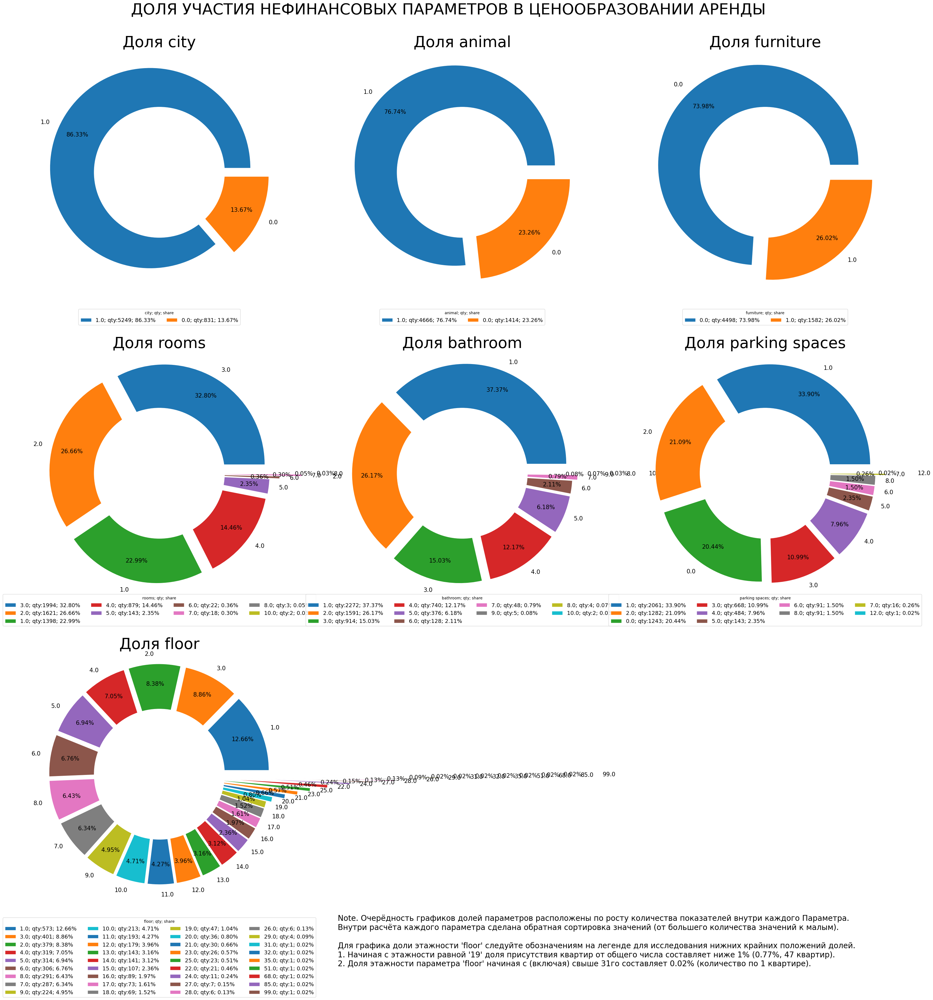

In [81]:
# ОБЩАЯ (ВСЕ ГОРОДА)
plot_pie_grid(df_data=df_RENT, non_cash_list=non_cash_list, figsize=(40,40),
              strtitle="ДОЛЯ УЧАСТИЯ НЕФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ",
              fontsize=40, x_title=None, y_title=0.92, labels_fontsize=15,
            #   legend_place=(0, -1, 0, 0),
              strnote = "Note. Очерёдность графиков долей параметров расположены по росту количества показателей внутри каждого Параметра.\n" + 
                        "Внутри расчёта каждого параметра сделана обратная сортировка значений (от большего количества значений к малым).\n\n" +
                        "Для графика доли этажности 'floor' следуйте обозначениям на легенде для исследования нижних крайних положений долей.\n" +
                        "1. Начиная с этажности равной '19' доля присутствия квартир от общего числа составляет ниже 1% (0.77%, 47 квартир).\n" +
                        "2. Доля этажности параметра 'floor' начиная с (включая) свыше 31го составляет 0.02% (количество по 1 квартире).",
               x_note=0.4, y_note=0.05,
               subfolder="percent"
              )

#### 10.6.1.1. Город '0'. ДОЛЯ УЧАСТИЯ НЕФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ

Файл 'images\percent/Город_'0'._Доля_Участия_Нефинансовых_Параметров_В_Ценообразовании_Аренды.png' сохранён


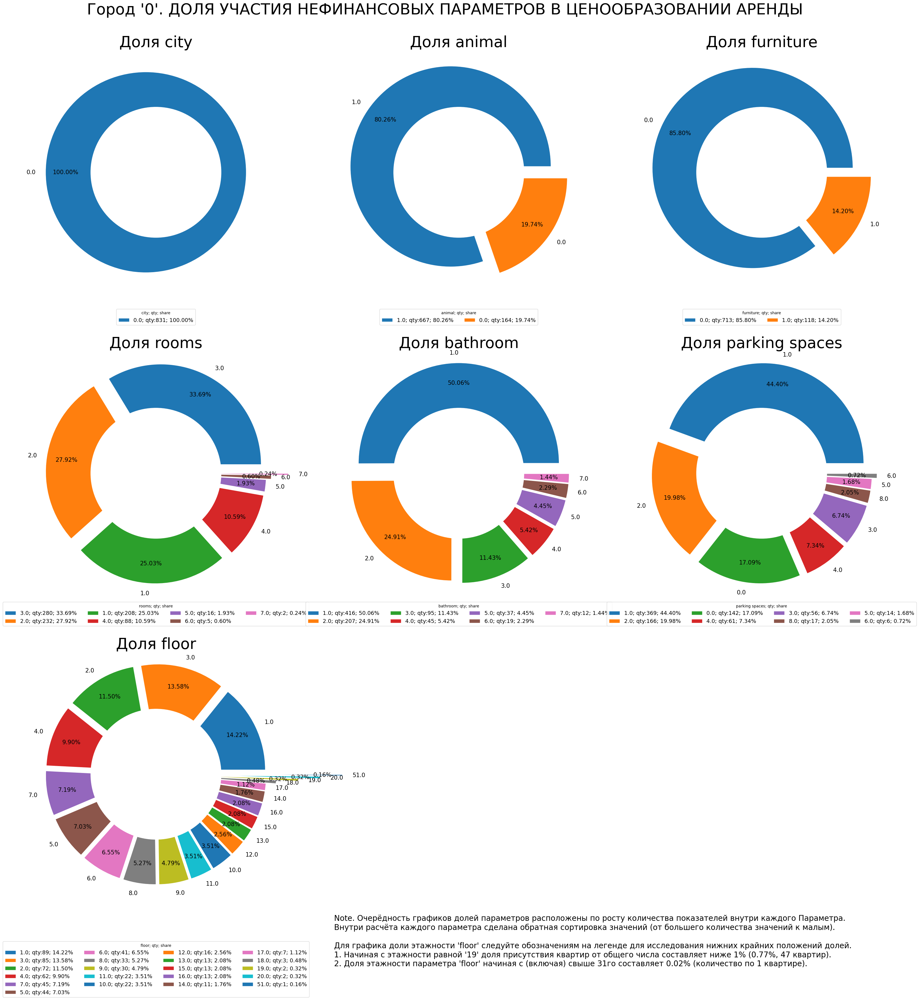

In [82]:
plot_pie_grid(df_data=df_RENT.query('city == 0'), non_cash_list=non_cash_list, figsize=(40,40),
              strtitle="Город '0'. ДОЛЯ УЧАСТИЯ НЕФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ",
              fontsize=40, x_title=None, y_title=0.92, labels_fontsize=15,
            #   legend_place=(0, -1, 0, 0),
              strnote = "Note. Очерёдность графиков долей параметров расположены по росту количества показателей внутри каждого Параметра.\n" + 
                        "Внутри расчёта каждого параметра сделана обратная сортировка значений (от большего количества значений к малым).\n\n" +
                        "Для графика доли этажности 'floor' следуйте обозначениям на легенде для исследования нижних крайних положений долей.\n" +
                        "1. Начиная с этажности равной '19' доля присутствия квартир от общего числа составляет ниже 1% (0.77%, 47 квартир).\n" +
                        "2. Доля этажности параметра 'floor' начиная с (включая) свыше 31го составляет 0.02% (количество по 1 квартире).",
               x_note=0.4, y_note=0.05,
               subfolder="percent"
              )

#### 10.6.1.2. Город '1'. ДОЛЯ УЧАСТИЯ НЕФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ

Файл 'images\percent/Город_'1'._Доля_Участия_Нефинансовых_Параметров_В_Ценообразовании_Аренды.png' сохранён


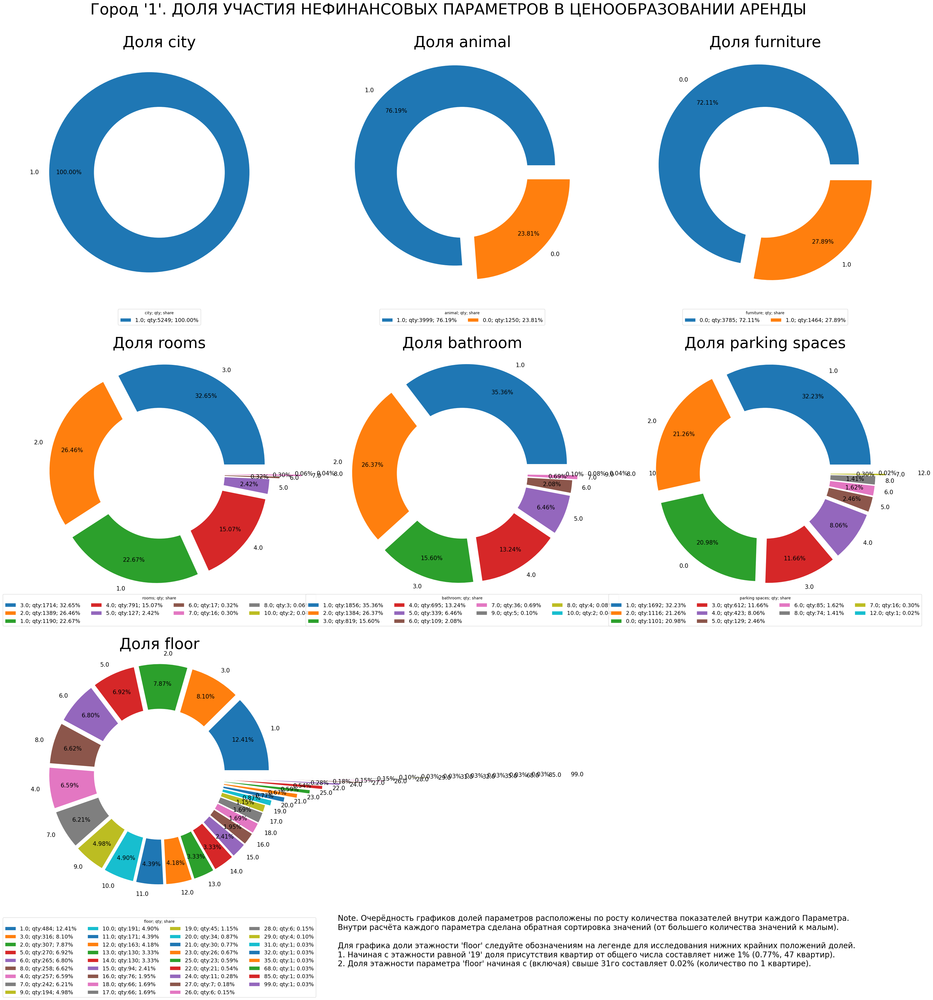

In [83]:
# Город '1'. ДОЛЯ УЧАСТИЯ НЕФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ
plot_pie_grid(df_data=df_RENT.query('city == 1'), non_cash_list=non_cash_list, figsize=(40,40),
              strtitle="Город '1'. ДОЛЯ УЧАСТИЯ НЕФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ",
              fontsize=40, x_title=None, y_title=0.92, labels_fontsize=15,
            #   legend_place=(0, -1, 0, 0),
              strnote = "Note. Очерёдность графиков долей параметров расположены по росту количества показателей внутри каждого Параметра.\n" + 
                        "Внутри расчёта каждого параметра сделана обратная сортировка значений (от большего количества значений к малым).\n\n" +
                        "Для графика доли этажности 'floor' следуйте обозначениям на легенде для исследования нижних крайних положений долей.\n" +
                        "1. Начиная с этажности равной '19' доля присутствия квартир от общего числа составляет ниже 1% (0.77%, 47 квартир).\n" +
                        "2. Доля этажности параметра 'floor' начиная с (включая) свыше 31го составляет 0.02% (количество по 1 квартире).",
               x_note=0.4, y_note=0.05,
               subfolder="percent"
              )

### **10.7. ДОЛЯ УЧАСТИЯ ФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ**

В данном разделе рассмотрены показатели с большим диапазоном данных. Поэтому выборка сделана для первых трёх значений долей. Это означает, что остальные доли малы по сравнению с отобранными и были объеденины в группу '% < other'.

Файл 'images\percent/Доля_Участия_Финансовых_Параметров_В_Ценообразовании_Аренды.png' сохранён


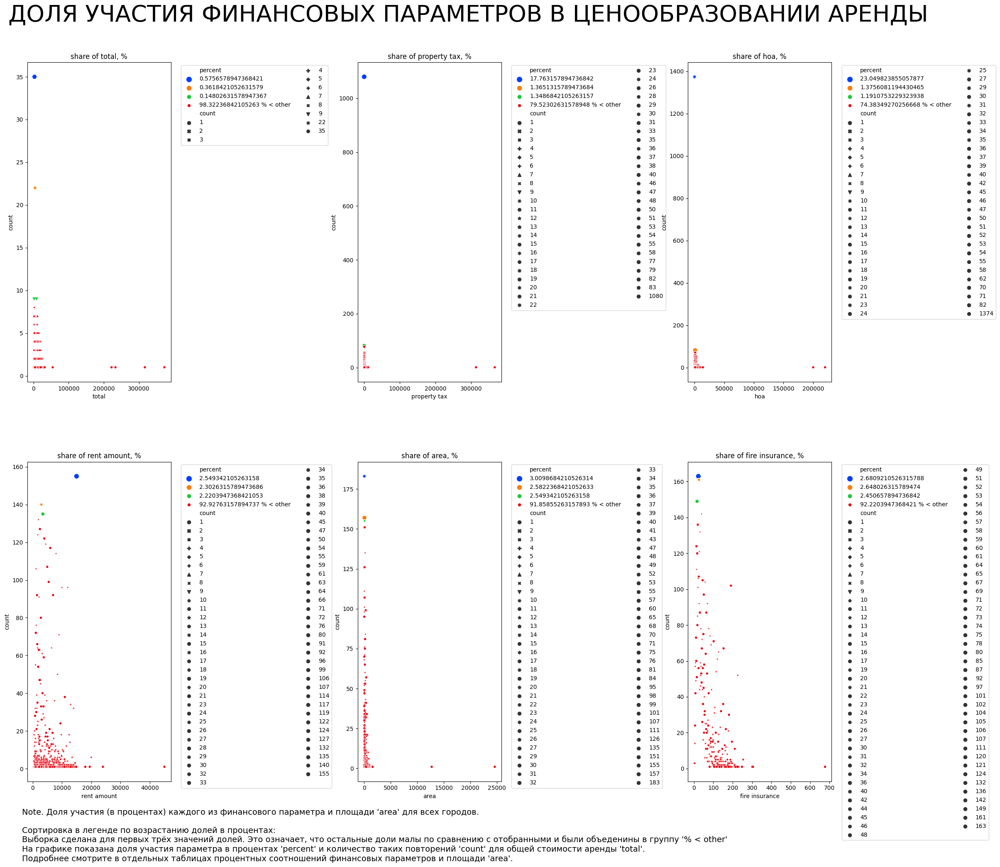

In [84]:
# ДОЛЯ УЧАСТИЯ ФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ
plot_box_grid(data=df_RENT,figsize=(25,35),
              # параметры графика и легенды
              kind="percent", legend_col=2, legend_fontsize=10,
              # заголовок
              strtitle="ДОЛЯ УЧАСТИЯ ФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ",
              fontsize=40, x_title=0.55, y_title=0.92, wspace=1.3, hspace=0.25,
              # примечание
              strnote="Note. Доля участия (в процентах) каждого из финансового параметра и площади 'area' для всех городов.\n\n" +
                      "Сортировка в легенде по возрастанию долей в процентах:\n" + 
                      "Выборка сделана для первых трёх значений долей. Это означает, что остальные доли малы по сравнению с отобранными и были объеденины в группу '% < other'\n" + 
                      "На графике показана доля участия параметра в процентах 'percent' и количество таких повторений 'count' для общей стоимости аренды 'total'.\n" +
                      "Подробнее смотрите в отдельных таблицах процентных соотношений финансовых параметров и площади 'area'.",
                      x_note=0.12, y_note=0.33,
                      nrow=2,
               subfolder="percent"
              )

#### 10.7.1. Город '0' - ДОЛЯ УЧАСТИЯ ФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ

Файл 'images\percent/Город_'0'_-_Доля_Участия_Финансовых_Параметров_В_Ценообразовании_Аренды.png' сохранён


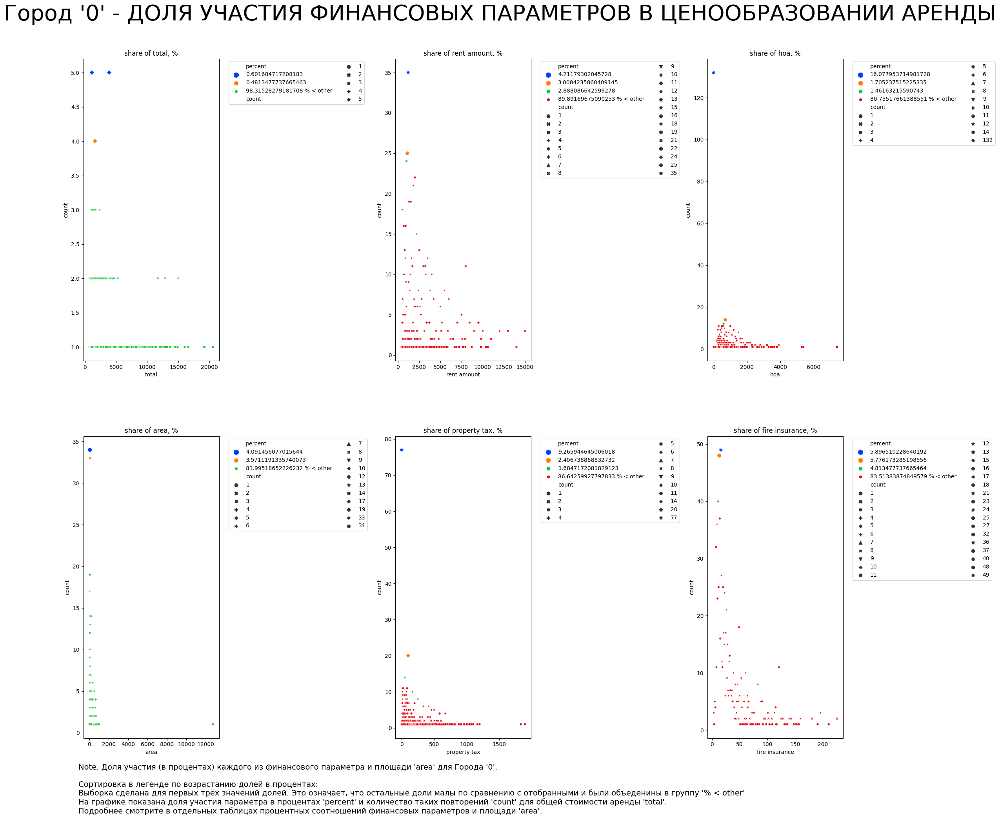

In [85]:
# Город '0' - ДОЛЯ УЧАСТИЯ ФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ
plot_box_grid(data=df_RENT,figsize=(25,35),
              # параметры графика и легенды
              kind="percent", legend_col=2, legend_fontsize=10,
              # заголовок
              strtitle="Город '0' - ДОЛЯ УЧАСТИЯ ФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ",
              fontsize=40, x_title=0.55, y_title=0.92, wspace=1.3, hspace=0.25,
              # примечание
              strnote="Note. Доля участия (в процентах) каждого из финансового параметра и площади 'area' для Города '0'.\n\n" +
                      "Сортировка в легенде по возрастанию долей в процентах:\n" + 
                      "Выборка сделана для первых трёх значений долей. Это означает, что остальные доли малы по сравнению с отобранными и были объеденины в группу '% < other'\n" + 
                      "На графике показана доля участия параметра в процентах 'percent' и количество таких повторений 'count' для общей стоимости аренды 'total'.\n" +
                      "Подробнее смотрите в отдельных таблицах процентных соотношений финансовых параметров и площади 'area'.",
                x_note=0.12, y_note=0.33,
                nrow=2,
                city="0",
                subfolder="percent"
              )

#### 10.7.2. Город '1' - ДОЛЯ УЧАСТИЯ ФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ

Файл 'images\percent/Город_'1'_-_Доля_Участия_Финансовых_Параметров_В_Ценообразовании_Аренды.png' сохранён


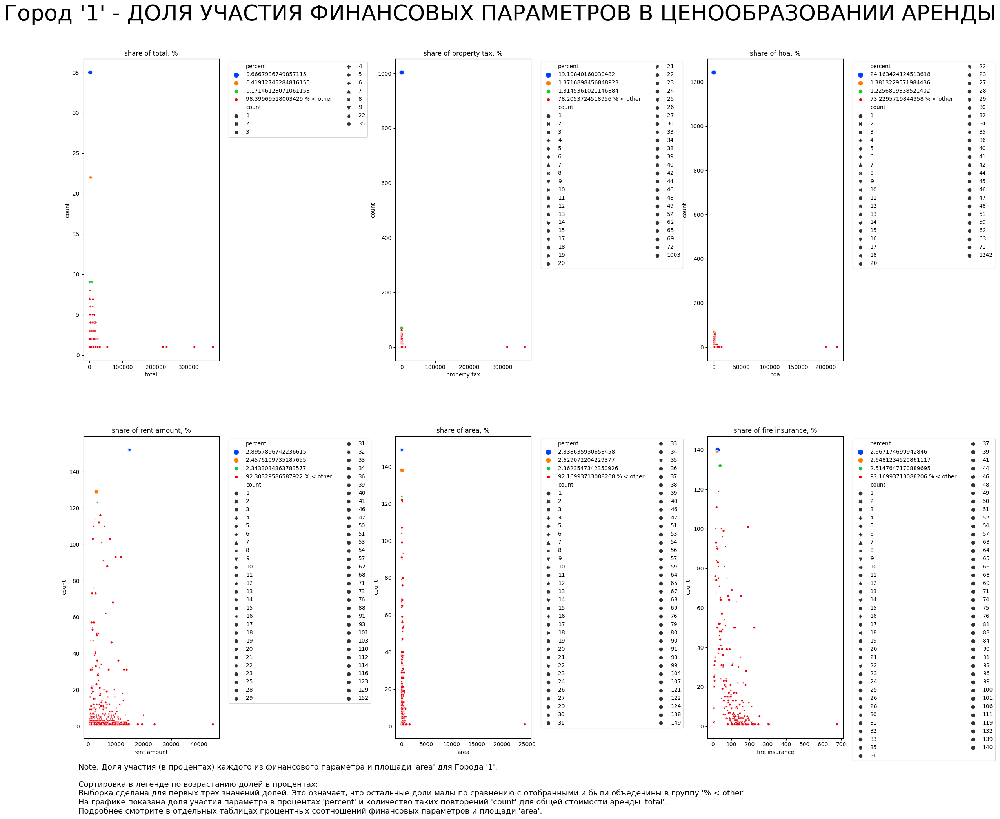

In [86]:
# Город '1' - ДОЛЯ УЧАСТИЯ ФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ
plot_box_grid(data=df_RENT,figsize=(25,35),
              # параметры графика и легенды
              kind="percent", legend_col=2, legend_fontsize=10,
              # заголовок
              strtitle="Город '1' - ДОЛЯ УЧАСТИЯ ФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ",
              fontsize=40, x_title=0.55, y_title=0.92, wspace=1.3, hspace=0.25,
              # примечание
              strnote="Note. Доля участия (в процентах) каждого из финансового параметра и площади 'area' для Города '1'.\n\n" +
                      "Сортировка в легенде по возрастанию долей в процентах:\n" + 
                      "Выборка сделана для первых трёх значений долей. Это означает, что остальные доли малы по сравнению с отобранными и были объеденины в группу '% < other'\n" + 
                      "На графике показана доля участия параметра в процентах 'percent' и количество таких повторений 'count' для общей стоимости аренды 'total'.\n" +
                      "Подробнее смотрите в отдельных таблицах процентных соотношений финансовых параметров и площади 'area'.",
              x_note=0.12, y_note=0.33,
              nrow=2,
              city="1",
              subfolder="percent"
              )

### **10.8. NAN - ДОЛЯ УЧАСТИЯ НЕФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ**

В анализе участвуют только строки, где содержатся неизвестные данные `'NAN'`

Файл 'images\percent\nan/Nan_-_Доля_Участия_Нефинансовых_Параметров_В_Ценообразовании_Аренды.png' сохранён


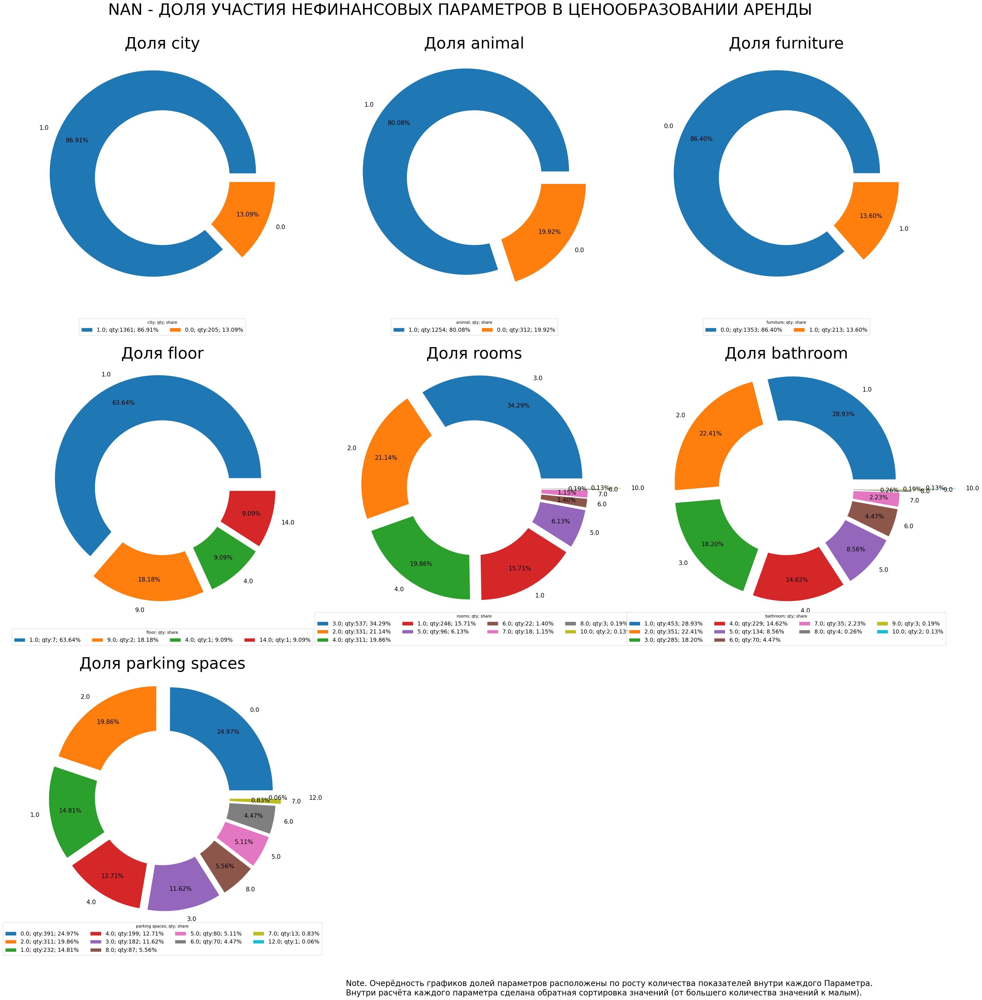

In [87]:
# NAN - ДОЛЯ УЧАСТИЯ НЕФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ
plot_pie_grid(df_data=df_NAN, non_cash_list=non_cash_list, figsize=(40,40),
              strtitle="NAN - ДОЛЯ УЧАСТИЯ НЕФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ",
              fontsize=40, x_title=None, y_title=0.92, labels_fontsize=15,
            #   legend_place=(0, -1, 0, 0),
              strnote = "Note. Очерёдность графиков долей параметров расположены по росту количества показателей внутри каждого Параметра.\n" + 
                        "Внутри расчёта каждого параметра сделана обратная сортировка значений (от большего количества значений к малым).",
               x_note=0.4, y_note=0.05,
               subfolder="percent/nan"
              )

#### 10.8.1. NAN-Город '0'-ДОЛЯ УЧАСТИЯ НЕФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ

Файл 'images\percent\nan/Nan-Город_'0'-Доля_Участия_Нефинансовых_Параметров_В_Ценообразовании_Аренды.png' сохранён


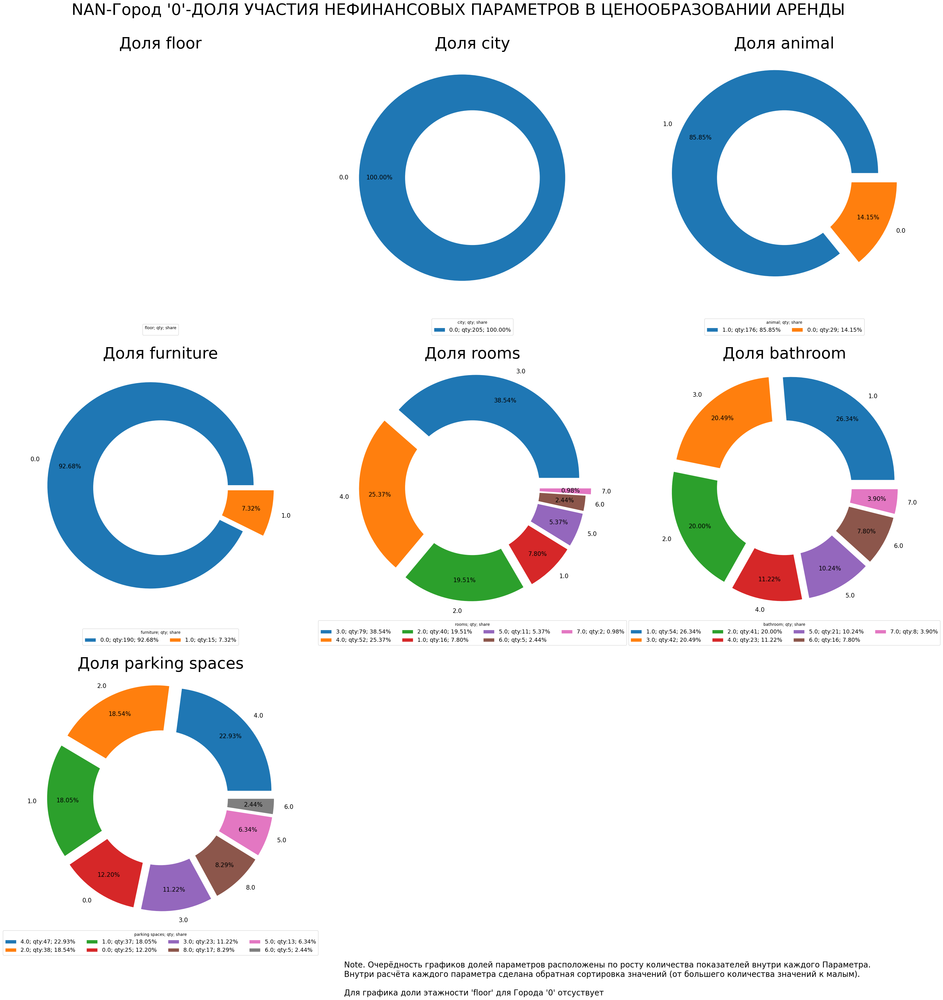

In [88]:
# NAN-Город '0'-ДОЛЯ УЧАСТИЯ НЕФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ
plot_pie_grid(df_data=df_NAN.query('city == 0'), non_cash_list=non_cash_list, figsize=(40,40),
              strtitle="NAN-Город '0'-ДОЛЯ УЧАСТИЯ НЕФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ",
              fontsize=40, x_title=None, y_title=0.92, labels_fontsize=15,
            #   legend_place=(0, -1, 0, 0),
              strnote = "Note. Очерёдность графиков долей параметров расположены по росту количества показателей внутри каждого Параметра.\n" + 
                        "Внутри расчёта каждого параметра сделана обратная сортировка значений (от большего количества значений к малым).\n\n" +
                        "Для графика доли этажности 'floor' для Города '0' отсуствует",
               x_note=0.4, y_note=0.05,
               subfolder="percent/nan"
              )

#### 10.8.2. NAN-Город '1'-ДОЛЯ УЧАСТИЯ НЕФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ

Файл 'images\percent\nan/Nan-Город_'1'-Доля_Участия_Нефинансовых_Параметров_В_Ценообразовании_Аренды.png' сохранён


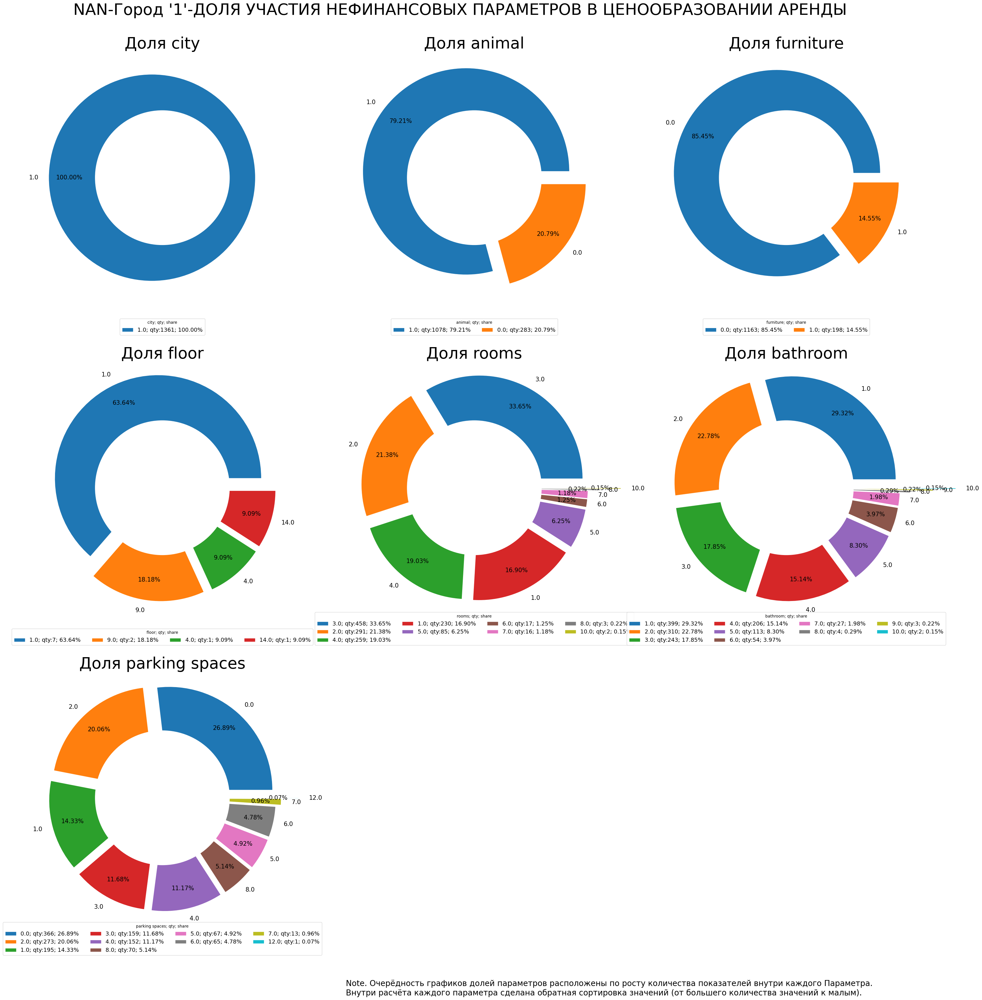

In [89]:
plot_pie_grid(df_data=df_NAN.query('city == 1'), non_cash_list=non_cash_list, figsize=(40,40),
              strtitle="NAN-Город '1'-ДОЛЯ УЧАСТИЯ НЕФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ",
              fontsize=40, x_title=None, y_title=0.92, labels_fontsize=15,
            #   legend_place=(0, -1, 0, 0),
              strnote = "Note. Очерёдность графиков долей параметров расположены по росту количества показателей внутри каждого Параметра.\n" + 
                        "Внутри расчёта каждого параметра сделана обратная сортировка значений (от большего количества значений к малым).",
               x_note=0.4, y_note=0.05,
               subfolder="percent/nan"
              )

### **10.9. NAN - ДОЛЯ УЧАСТИЯ ФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ**

Файл 'images\percent\nan/Nan_-_Доля_Участия_Финансовых_Параметров_В_Ценообразовании_Аренды.png' сохранён


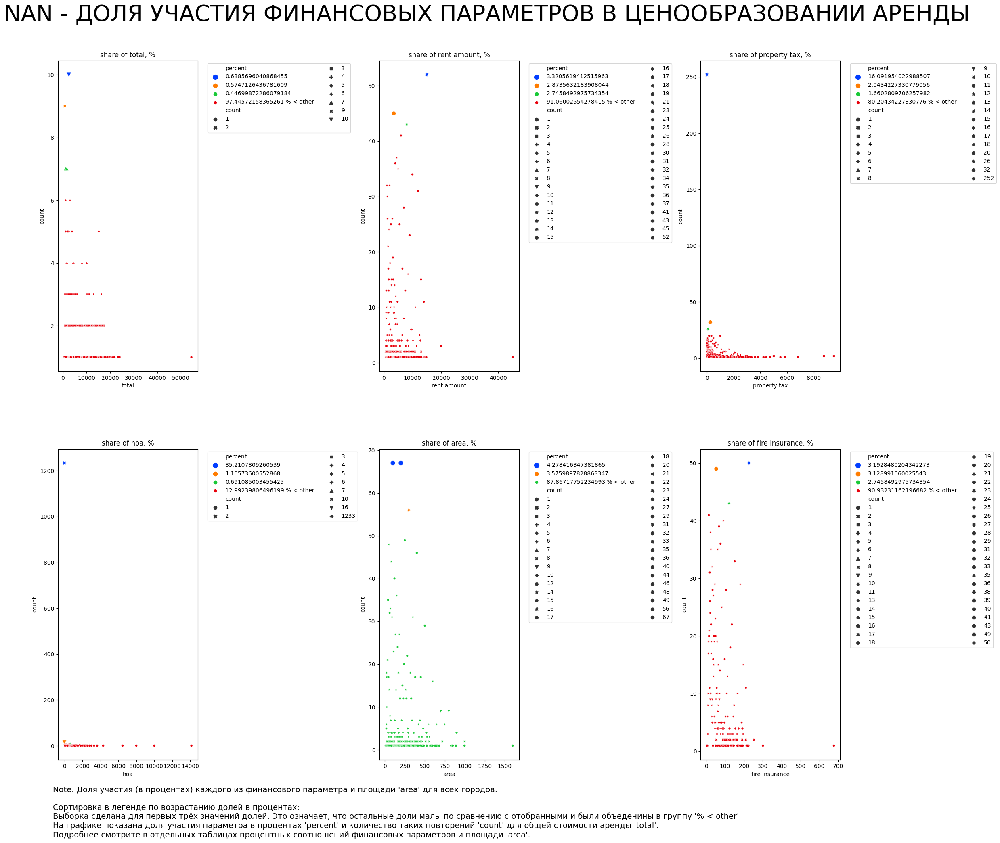

In [90]:
# ДОЛЯ УЧАСТИЯ ФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ
plot_box_grid(data=df_NAN,figsize=(25,35),
              # параметры графика и легенды
              kind="percent", legend_col=2, legend_fontsize=10,
              # заголовок
              strtitle="NAN - ДОЛЯ УЧАСТИЯ ФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ",
              fontsize=40, x_title=0.55, y_title=0.92, wspace=1.3, hspace=0.25,
              # примечание
              strnote="Note. Доля участия (в процентах) каждого из финансового параметра и площади 'area' для всех городов.\n\n" +
                      "Сортировка в легенде по возрастанию долей в процентах:\n" + 
                      "Выборка сделана для первых трёх значений долей. Это означает, что остальные доли малы по сравнению с отобранными и были объеденины в группу '% < other'\n" + 
                      "На графике показана доля участия параметра в процентах 'percent' и количество таких повторений 'count' для общей стоимости аренды 'total'.\n" +
                      "Подробнее смотрите в отдельных таблицах процентных соотношений финансовых параметров и площади 'area'.",
                      x_note=0.12, y_note=0.33,
                      nrow=2,
               subfolder="percent/nan"
              )

#### 10.9.1. NAN - Город '0' - ДОЛЯ УЧАСТИЯ ФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ

Файл 'images\percent\nan/Nan_-_Город_'0'_-_Доля_Участия_Финансовых_Параметров_В_Ценообразовании_Аренды.png' сохранён


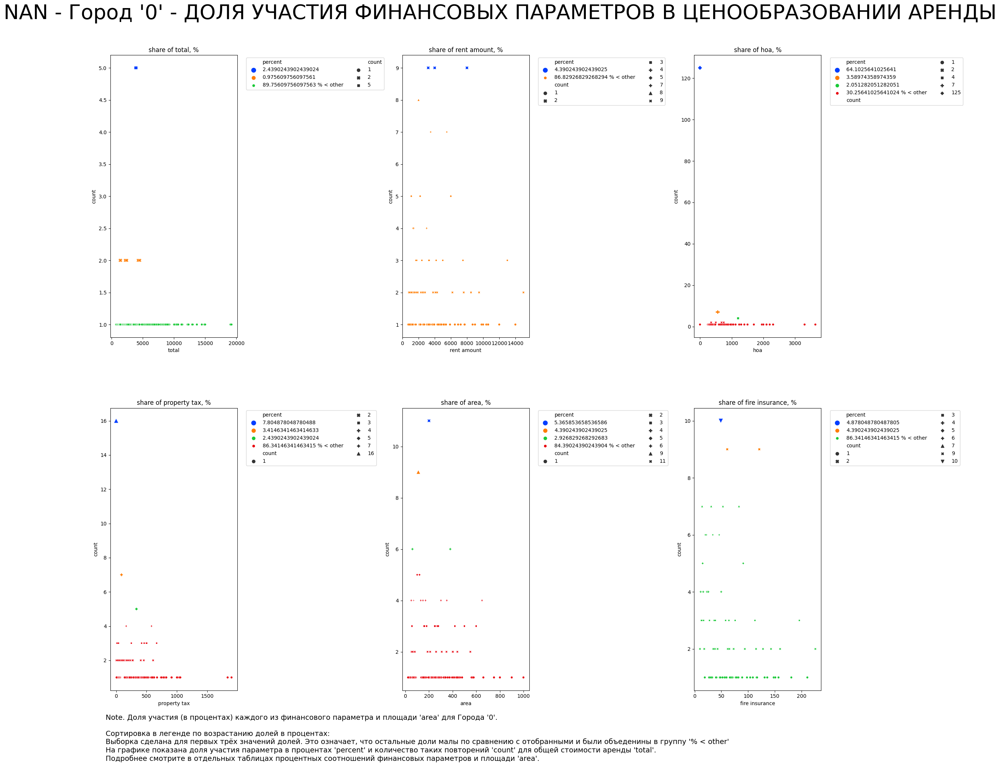

In [91]:
# NAN -Город '0' - ДОЛЯ УЧАСТИЯ ФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ
plot_box_grid(data=df_NAN,figsize=(25,35),
              # параметры графика и легенды
              kind="percent", legend_col=2, legend_fontsize=10,
              # заголовок
              strtitle="NAN - Город '0' - ДОЛЯ УЧАСТИЯ ФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ",
              fontsize=40, x_title=0.55, y_title=0.92, wspace=1.3, hspace=0.25,
              # примечание
              strnote="Note. Доля участия (в процентах) каждого из финансового параметра и площади 'area' для Города '0'.\n\n" +
                      "Сортировка в легенде по возрастанию долей в процентах:\n" + 
                      "Выборка сделана для первых трёх значений долей. Это означает, что остальные доли малы по сравнению с отобранными и были объеденины в группу '% < other'\n" + 
                      "На графике показана доля участия параметра в процентах 'percent' и количество таких повторений 'count' для общей стоимости аренды 'total'.\n" +
                      "Подробнее смотрите в отдельных таблицах процентных соотношений финансовых параметров и площади 'area'.",
                x_note=0.12, y_note=0.33,
                nrow=2,
                city="0",
                subfolder="percent/nan"
              )

#### 10.9.2. NAN - Город '1' - ДОЛЯ УЧАСТИЯ ФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ

Файл 'images\percent\nan/Nan_-_Город_'1'_-_Доля_Участия_Финансовых_Параметров_В_Ценообразовании_Аренды.png' сохранён


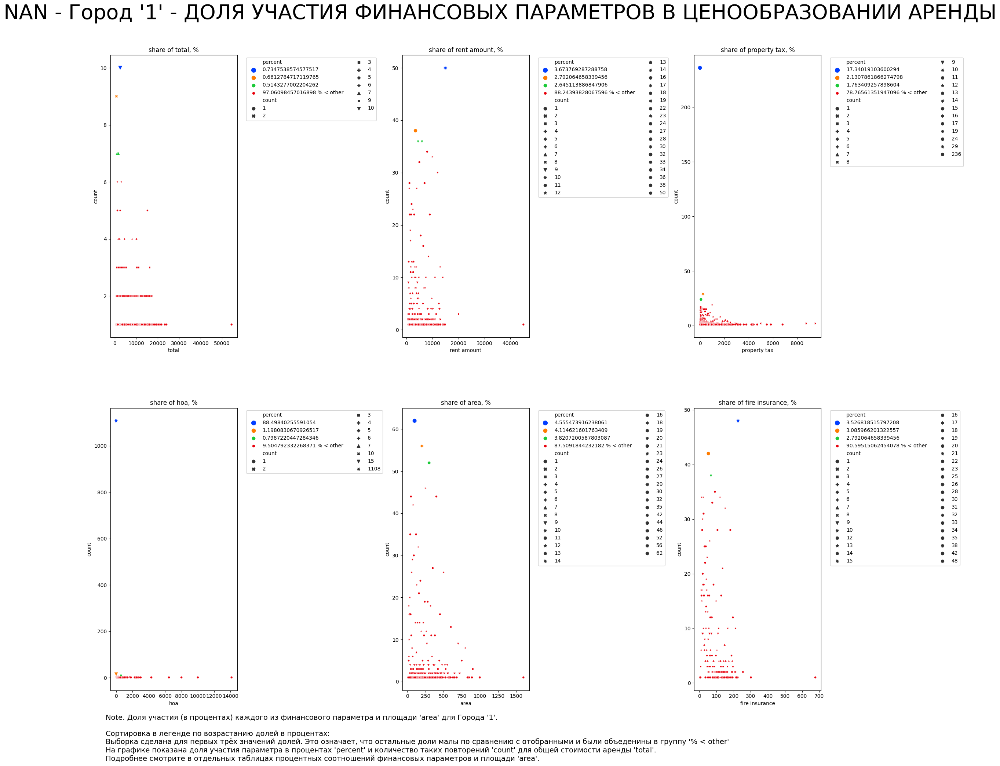

In [92]:
# NAN -Город '1' - ДОЛЯ УЧАСТИЯ ФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ
plot_box_grid(data=df_NAN,figsize=(25,35),
              # параметры графика и легенды
              kind="percent", legend_col=2, legend_fontsize=10,
              # заголовок
              strtitle="NAN - Город '1' - ДОЛЯ УЧАСТИЯ ФИНАНСОВЫХ ПАРАМЕТРОВ В ЦЕНООБРАЗОВАНИИ АРЕНДЫ",
              fontsize=40, x_title=0.55, y_title=0.92, wspace=1.3, hspace=0.25,
              # примечание
              strnote="Note. Доля участия (в процентах) каждого из финансового параметра и площади 'area' для Города '1'.\n\n" +
                      "Сортировка в легенде по возрастанию долей в процентах:\n" + 
                      "Выборка сделана для первых трёх значений долей. Это означает, что остальные доли малы по сравнению с отобранными и были объеденины в группу '% < other'\n" + 
                      "На графике показана доля участия параметра в процентах 'percent' и количество таких повторений 'count' для общей стоимости аренды 'total'.\n" +
                      "Подробнее смотрите в отдельных таблицах процентных соотношений финансовых параметров и площади 'area'.",
              x_note=0.12, y_note=0.33,
              nrow=2,
              city="1",
              subfolder="percent/nan"
              )

# **11. РЕЗЮМЕ**

В данной работе сделана первичная визуальная оценка таблиц и графиков. Выводы и заключения оформлены в каждом разделе, по мере очистки и анализа данных, а так же на самих графиках.

Детально ознакомиться с графиками в хорошем качестве и сводными таблицами анализа можно в каталогах:

1. `"./data"`
2. `"./images"`
